In [74]:
import pandas as pd
import os
#import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [75]:
data = pd.read_csv('data/training.csv')
data.head(3)

,Id,age,gender,index,height(m),weight(kg)
0,0,31,0,female_164.jpg,1.64,61.949811
1,1,39,0,female_164_1.jpg,1.64,61.949811
2,2,25,0,female_164_2.jpg,1.64,61.949811


### Calculate BMI

In [76]:
data['BMI'] = data['weight(kg)'] / (data['height(m)'] * 2)

In [77]:
data['BMI']

0      18.887138
1      18.887138
2      18.887138
3      18.887138
4      18.887138
         ...    
469    15.305090
470    15.170600
471    15.104320
472    14.782210
473    14.297015
Name: BMI, Length: 474, dtype: float64

In [78]:
from mtcnn.mtcnn import MTCNN
import cv2

test_dir = 'data/test/'
train_dir = 'data/train/'
test_processed_dir = 'data/test_aligned/'
train_processed_dir = 'data/train_aligned/'

os.listdir(test_dir)

['female_149.jpg',
 'female_151.jpg',
 'female_153.jpg',
 'female_154.jpg',
 'female_154_1.jpg',
 'female_155.jpg',
 'female_155_1.jpg',
 'female_155_2.jpg',
 'female_156.jpg',
 'female_157.jpg',
 'female_157_1.jpg',
 'female_159.jpg',
 'female_159_1.jpg',
 'female_160.jpg',
 'female_160_1.jpg',
 'female_162.jpg',
 'female_162_2.jpg',
 'female_162_3.jpg',
 'female_162_4.jpg',
 'female_163.jpg',
 'female_163_1.jpg',
 'female_163_2.jpg',
 'female_163_3.jpg',
 'female_163_4.jpg',
 'female_163_5.jpg',
 'male_170_10.jpg',
 'male_170_5.jpg',
 'male_170_6.jpg',
 'male_170_7.jpg',
 'male_170_8.jpg',
 'male_170_9.jpg',
 'male_171.jpg',
 'male_171_1.jpg',
 'male_171_2.jpg',
 'male_171_3.jpg',
 'male_171_4.jpg',
 'male_171_5.jpg',
 'male_171_6.jpg',
 'male_171_7.jpg',
 'male_171_8.jpg',
 'male_172.jpg',
 'male_172_1.jpg',
 'male_172_10.jpg',
 'male_172_11.jpg',
 'male_172_12.jpg',
 'male_172_2.jpg',
 'male_172_3.jpg',
 'male_172_4.jpg',
 'male_172_5.jpg',
 'male_172_6.jpg',
 'male_172_7.jpg',
 'm

In [79]:
img = cv2.cvtColor(cv2.imread(test_dir + 'male_170_5.jpg'), cv2.COLOR_BGR2RGB)
detector = MTCNN()
print(detector.detect_faces(img))
box = detector.detect_faces(img)[0]

1/1 [==============================] - 1s 560ms/step
[{'box': [112, 87, 332, 411], 'confidence': 0.9999909400939941, 'keypoints': {'left_eye': (198, 237), 'right_eye': (340, 241), 'nose': (263, 320), 'mouth_left': (210, 396), 'mouth_right': (331, 397)}}]
1/1 [==============================] - 0s 127ms/step


In [80]:
#pip install mtcnn

In [81]:
from keras.preprocessing import image
from keras.utils.layer_utils import get_source_inputs
from tensorflow.keras.utils import load_img, img_to_array
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

def crop_img(im,x,y,w,h):
    return im[y:(y+h),x:(x+w)]

def detect_face(face_path):
    img = cv2.cvtColor(cv2.imread(face_path), cv2.COLOR_BGR2RGB)
    box = detector.detect_faces(img)[0]
    return box

def detect_faces(face_path):
    #img = cv2.cvtColor(cv2.imread(face_path), cv2.COLOR_BGR2RGB)
    img = load_img(face_path)
    img = img_to_array(img)
    box = detector.detect_faces(img)
    return box

def draw_box(face_path = './test/male_170_5.jpg', plot = True):
    
    boxes = detect_faces(face_path)
    im = np.array(Image.open(face_path), dtype=np.uint8)
    
    if plot:
        # Create figure and axes
        num_box = len(boxes)
        fig,ax = plt.subplots(1, (1 + num_box))
        fig.set_size_inches(4 * (1 + num_box),4)
        # Display the image
        ax[0].imshow(im)
        ax[0].axis('off')
        # Create a Rectangle patch
        for idx, box in enumerate(boxes):
            box_x, box_y, box_w, box_h = box['box']
            rect = patches.Rectangle((box_x, box_y), box_w, box_h, linewidth=1,edgecolor='r',facecolor='none')
            ax[0].add_patch(rect)
            ax[0].text(box_x, box_y, '{:3.2f}'.format(box['confidence']))
            for i in box['keypoints'].keys():
                circle = patches.Circle(box['keypoints'][i], radius = 5, color = 'red')
                ax[0].add_patch(circle)
            ax[1 + idx].imshow(crop_img(im, *box['box']))
            ax[1 + idx].axis('off')
        plt.show()
    
    res = [crop_img(im, *box['box']) for box in boxes]
    
    return res

1/1 [==============================] - 0s 141ms/step


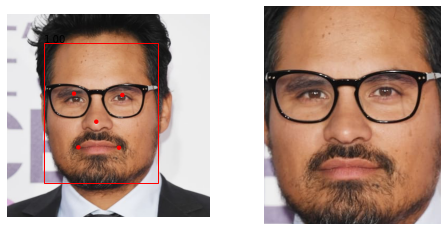

In [82]:
res = draw_box(test_dir + 'male_170_5.jpg')

1/1 [==============================] - 0s 115ms/step


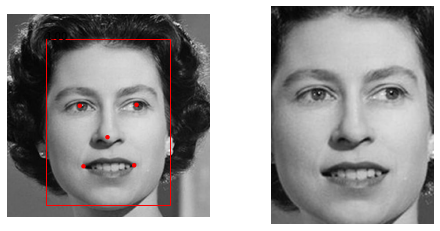

1/1 [==============================] - 0s 148ms/step


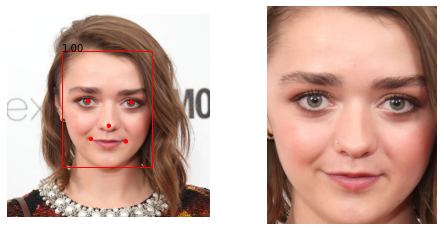

1/1 [==============================] - 0s 120ms/step


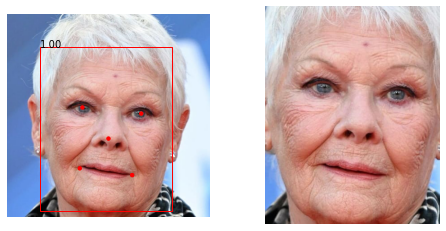

In [83]:
#get AOI for the first 3 images in the test folder
for img in os.listdir(test_dir)[:3]:
    draw_box(test_dir + img)

In [84]:
from tqdm import tqdm
import shutil
if os.path.exists(test_processed_dir):
    shutil.rmtree(test_processed_dir)
os.mkdir(test_processed_dir)
for img in tqdm(os.listdir(test_dir)):
    box = detect_face(test_dir + img)
    im = plt.imread(test_dir + img)
    cropped = crop_img(im, *box['box'])
    plt.imsave(test_processed_dir+img, crop_img(im, *box['box']))

  0%|          | 0/315 [00:00<?, ?it/s]

1/1 [==============================] - 0s 104ms/step


  0%|          | 1/315 [00:03<20:07,  3.84s/it]

1/1 [==============================] - 0s 150ms/step


  1%|          | 2/315 [00:07<20:32,  3.94s/it]

1/1 [==============================] - 0s 129ms/step


  1%|          | 3/315 [00:11<19:58,  3.84s/it]

1/1 [==============================] - 0s 125ms/step


  1%|▏         | 4/315 [00:15<19:40,  3.80s/it]

1/1 [==============================] - 0s 141ms/step


  2%|▏         | 5/315 [00:18<19:25,  3.76s/it]

1/1 [==============================] - 0s 114ms/step


  2%|▏         | 6/315 [00:22<19:15,  3.74s/it]

1/1 [==============================] - 0s 114ms/step


  2%|▏         | 7/315 [00:26<19:27,  3.79s/it]

1/1 [==============================] - 0s 140ms/step


  3%|▎         | 8/315 [00:30<19:29,  3.81s/it]

1/1 [==============================] - 0s 125ms/step


  3%|▎         | 9/315 [00:33<18:56,  3.71s/it]

1/1 [==============================] - 0s 152ms/step


  3%|▎         | 10/315 [00:38<19:35,  3.85s/it]

1/1 [==============================] - 0s 145ms/step


  3%|▎         | 11/315 [00:41<19:27,  3.84s/it]

1/1 [==============================] - 0s 112ms/step


  4%|▍         | 12/315 [00:45<19:12,  3.80s/it]

1/1 [==============================] - 0s 114ms/step


  4%|▍         | 13/315 [00:48<18:13,  3.62s/it]

1/1 [==============================] - 0s 148ms/step


  4%|▍         | 14/315 [00:52<18:25,  3.67s/it]

1/1 [==============================] - 0s 156ms/step


  5%|▍         | 15/315 [00:56<18:34,  3.72s/it]

1/1 [==============================] - 0s 144ms/step


  5%|▌         | 16/315 [01:00<18:29,  3.71s/it]

1/1 [==============================] - 0s 114ms/step


  5%|▌         | 17/315 [01:03<18:03,  3.63s/it]

1/1 [==============================] - 0s 134ms/step


  6%|▌         | 18/315 [01:07<18:01,  3.64s/it]

1/1 [==============================] - 0s 136ms/step


  6%|▌         | 19/315 [01:11<18:08,  3.68s/it]

1/1 [==============================] - 0s 163ms/step


  6%|▋         | 20/315 [01:15<18:35,  3.78s/it]

1/1 [==============================] - 0s 105ms/step


  7%|▋         | 21/315 [01:18<18:41,  3.81s/it]

1/1 [==============================] - 0s 131ms/step


  7%|▋         | 22/315 [01:22<18:19,  3.75s/it]

1/1 [==============================] - 0s 178ms/step


  7%|▋         | 23/315 [01:26<18:26,  3.79s/it]

1/1 [==============================] - 0s 124ms/step


  8%|▊         | 24/315 [01:30<18:36,  3.84s/it]

1/1 [==============================] - 0s 132ms/step


  8%|▊         | 25/315 [01:34<19:04,  3.95s/it]

1/1 [==============================] - 0s 134ms/step


  8%|▊         | 26/315 [01:37<18:13,  3.78s/it]

1/1 [==============================] - 0s 134ms/step


  9%|▊         | 27/315 [01:42<18:49,  3.92s/it]

1/1 [==============================] - 0s 134ms/step


  9%|▉         | 28/315 [01:46<18:50,  3.94s/it]

1/1 [==============================] - 0s 105ms/step


  9%|▉         | 29/315 [01:50<18:39,  3.91s/it]

1/1 [==============================] - 0s 144ms/step


 10%|▉         | 30/315 [01:53<17:42,  3.73s/it]

1/1 [==============================] - 0s 154ms/step


 10%|▉         | 31/315 [01:58<19:15,  4.07s/it]

1/1 [==============================] - 0s 122ms/step


 10%|█         | 32/315 [02:02<18:55,  4.01s/it]

1/1 [==============================] - 0s 109ms/step


 10%|█         | 33/315 [02:05<18:34,  3.95s/it]

1/1 [==============================] - 0s 136ms/step


 11%|█         | 34/315 [02:09<17:45,  3.79s/it]

1/1 [==============================] - 0s 137ms/step


 11%|█         | 35/315 [02:13<17:57,  3.85s/it]

1/1 [==============================] - 0s 102ms/step


 11%|█▏        | 36/315 [02:17<17:45,  3.82s/it]

1/1 [==============================] - 0s 168ms/step


 12%|█▏        | 37/315 [02:21<18:02,  3.89s/it]

1/1 [==============================] - 0s 146ms/step


 12%|█▏        | 38/315 [02:24<17:46,  3.85s/it]

1/1 [==============================] - 0s 135ms/step


 12%|█▏        | 39/315 [02:28<18:04,  3.93s/it]

1/1 [==============================] - 0s 133ms/step


 13%|█▎        | 40/315 [02:32<17:56,  3.91s/it]

1/1 [==============================] - 0s 147ms/step


 13%|█▎        | 41/315 [02:37<18:41,  4.09s/it]

1/1 [==============================] - 0s 112ms/step


 13%|█▎        | 42/315 [02:40<17:36,  3.87s/it]

1/1 [==============================] - 0s 127ms/step


 14%|█▎        | 43/315 [02:44<17:26,  3.85s/it]

1/1 [==============================] - 0s 136ms/step


 14%|█▍        | 44/315 [02:48<17:06,  3.79s/it]

1/1 [==============================] - 0s 180ms/step


 14%|█▍        | 45/315 [02:52<17:32,  3.90s/it]

1/1 [==============================] - 0s 130ms/step


 15%|█▍        | 46/315 [02:55<16:38,  3.71s/it]

1/1 [==============================] - 0s 142ms/step


 15%|█▍        | 47/315 [02:59<16:35,  3.72s/it]

1/1 [==============================] - 0s 190ms/step


 15%|█▌        | 48/315 [03:03<17:11,  3.86s/it]

1/1 [==============================] - 0s 183ms/step


 16%|█▌        | 49/315 [03:07<17:12,  3.88s/it]

1/1 [==============================] - 0s 128ms/step


 16%|█▌        | 50/315 [03:11<17:40,  4.00s/it]

1/1 [==============================] - 0s 119ms/step


 16%|█▌        | 51/315 [03:15<17:18,  3.93s/it]

1/1 [==============================] - 0s 138ms/step


 17%|█▋        | 52/315 [03:19<17:27,  3.98s/it]

1/1 [==============================] - 0s 142ms/step


 17%|█▋        | 53/315 [03:23<17:35,  4.03s/it]

1/1 [==============================] - 0s 120ms/step


 17%|█▋        | 54/315 [03:27<17:35,  4.04s/it]

1/1 [==============================] - 0s 153ms/step


 17%|█▋        | 55/315 [03:31<17:14,  3.98s/it]

1/1 [==============================] - 0s 138ms/step


 18%|█▊        | 56/315 [03:35<17:17,  4.00s/it]

1/1 [==============================] - 0s 132ms/step


 18%|█▊        | 57/315 [03:39<16:55,  3.93s/it]

1/1 [==============================] - 0s 178ms/step


 18%|█▊        | 58/315 [03:43<16:58,  3.96s/it]

1/1 [==============================] - 0s 136ms/step


 19%|█▊        | 59/315 [03:47<16:23,  3.84s/it]

1/1 [==============================] - 0s 139ms/step


 19%|█▉        | 60/315 [03:50<16:19,  3.84s/it]

1/1 [==============================] - 0s 153ms/step


 19%|█▉        | 61/315 [03:54<16:33,  3.91s/it]

1/1 [==============================] - 0s 195ms/step


 20%|█▉        | 62/315 [03:59<16:49,  3.99s/it]

1/1 [==============================] - 0s 158ms/step


 20%|██        | 63/315 [04:03<17:42,  4.22s/it]

1/1 [==============================] - 0s 136ms/step


 20%|██        | 64/315 [04:07<17:06,  4.09s/it]

1/1 [==============================] - 0s 113ms/step


 21%|██        | 65/315 [04:11<16:35,  3.98s/it]

1/1 [==============================] - 0s 131ms/step


 21%|██        | 66/315 [04:15<16:17,  3.93s/it]

1/1 [==============================] - 0s 156ms/step


 21%|██▏       | 67/315 [04:18<15:52,  3.84s/it]

1/1 [==============================] - 0s 177ms/step


 22%|██▏       | 68/315 [04:23<16:16,  3.95s/it]

1/1 [==============================] - 0s 143ms/step


 22%|██▏       | 69/315 [04:26<16:06,  3.93s/it]

1/1 [==============================] - 0s 126ms/step


 22%|██▏       | 70/315 [04:30<16:00,  3.92s/it]

1/1 [==============================] - 0s 170ms/step


 23%|██▎       | 71/315 [04:34<15:56,  3.92s/it]

1/1 [==============================] - 0s 117ms/step


 23%|██▎       | 72/315 [04:38<15:50,  3.91s/it]

1/1 [==============================] - 0s 200ms/step


 23%|██▎       | 73/315 [04:42<15:52,  3.94s/it]

1/1 [==============================] - 0s 145ms/step


 23%|██▎       | 74/315 [04:46<15:52,  3.95s/it]

1/1 [==============================] - 0s 139ms/step


 24%|██▍       | 75/315 [04:50<15:17,  3.82s/it]

1/1 [==============================] - 0s 147ms/step


 24%|██▍       | 76/315 [04:54<15:42,  3.94s/it]

1/1 [==============================] - 0s 150ms/step


 24%|██▍       | 77/315 [04:58<15:52,  4.00s/it]

1/1 [==============================] - 0s 131ms/step


 25%|██▍       | 78/315 [05:02<15:31,  3.93s/it]

1/1 [==============================] - 0s 121ms/step


 25%|██▌       | 79/315 [05:05<14:34,  3.71s/it]

1/1 [==============================] - 0s 133ms/step


 25%|██▌       | 80/315 [05:09<14:37,  3.74s/it]

1/1 [==============================] - 0s 151ms/step


 26%|██▌       | 81/315 [05:13<15:11,  3.89s/it]

1/1 [==============================] - 0s 153ms/step


 26%|██▌       | 82/315 [05:17<15:12,  3.92s/it]

1/1 [==============================] - 0s 114ms/step


 26%|██▋       | 83/315 [05:21<14:38,  3.79s/it]

1/1 [==============================] - 0s 195ms/step


 27%|██▋       | 84/315 [05:25<15:13,  3.95s/it]

1/1 [==============================] - 0s 124ms/step


 27%|██▋       | 85/315 [05:29<15:03,  3.93s/it]

1/1 [==============================] - 0s 150ms/step


 27%|██▋       | 86/315 [05:33<15:07,  3.96s/it]

1/1 [==============================] - 0s 152ms/step


 28%|██▊       | 87/315 [05:37<15:12,  4.00s/it]

1/1 [==============================] - 0s 151ms/step


 28%|██▊       | 88/315 [05:41<15:47,  4.17s/it]

1/1 [==============================] - 0s 138ms/step


 28%|██▊       | 89/315 [05:45<15:26,  4.10s/it]

1/1 [==============================] - 0s 132ms/step


 29%|██▊       | 90/315 [05:49<15:15,  4.07s/it]

1/1 [==============================] - 0s 138ms/step


 29%|██▉       | 91/315 [05:53<14:32,  3.89s/it]

1/1 [==============================] - 0s 127ms/step


 29%|██▉       | 92/315 [05:57<15:18,  4.12s/it]

1/1 [==============================] - 0s 125ms/step


 30%|██▉       | 93/315 [06:02<15:12,  4.11s/it]

1/1 [==============================] - 0s 109ms/step


 30%|██▉       | 94/315 [06:05<14:49,  4.02s/it]

1/1 [==============================] - 0s 149ms/step


 30%|███       | 95/315 [06:09<14:02,  3.83s/it]

1/1 [==============================] - 0s 135ms/step


 30%|███       | 96/315 [06:13<14:07,  3.87s/it]

1/1 [==============================] - 0s 179ms/step


 31%|███       | 97/315 [06:17<14:33,  4.01s/it]

1/1 [==============================] - 0s 178ms/step


 31%|███       | 98/315 [06:21<14:24,  3.98s/it]

1/1 [==============================] - 0s 137ms/step


 31%|███▏      | 99/315 [06:25<14:49,  4.12s/it]

1/1 [==============================] - 0s 138ms/step


 32%|███▏      | 100/315 [06:30<14:43,  4.11s/it]

1/1 [==============================] - 0s 149ms/step


 32%|███▏      | 101/315 [06:34<14:45,  4.14s/it]

1/1 [==============================] - 0s 130ms/step


 32%|███▏      | 102/315 [06:38<14:27,  4.07s/it]

1/1 [==============================] - 0s 122ms/step


 33%|███▎      | 103/315 [06:41<13:56,  3.95s/it]

1/1 [==============================] - 0s 196ms/step


 33%|███▎      | 104/315 [06:45<13:56,  3.96s/it]

1/1 [==============================] - 0s 168ms/step


 33%|███▎      | 105/315 [06:49<13:58,  3.99s/it]

1/1 [==============================] - 0s 100ms/step


 34%|███▎      | 106/315 [06:53<14:02,  4.03s/it]

1/1 [==============================] - 0s 201ms/step


 34%|███▍      | 107/315 [06:57<13:47,  3.98s/it]

1/1 [==============================] - 0s 150ms/step


 34%|███▍      | 108/315 [07:02<14:14,  4.13s/it]

1/1 [==============================] - 0s 135ms/step


 35%|███▍      | 109/315 [07:06<14:02,  4.09s/it]

1/1 [==============================] - 0s 145ms/step


 35%|███▍      | 110/315 [07:10<13:54,  4.07s/it]

1/1 [==============================] - 0s 168ms/step


 35%|███▌      | 111/315 [07:15<14:32,  4.28s/it]

1/1 [==============================] - 0s 139ms/step


 36%|███▌      | 112/315 [07:19<14:29,  4.28s/it]

1/1 [==============================] - 0s 154ms/step


 36%|███▌      | 113/315 [07:23<14:04,  4.18s/it]

1/1 [==============================] - 0s 150ms/step


 36%|███▌      | 114/315 [07:27<13:57,  4.17s/it]

1/1 [==============================] - 0s 137ms/step


 37%|███▋      | 115/315 [07:31<13:32,  4.06s/it]

1/1 [==============================] - 0s 146ms/step


 37%|███▋      | 116/315 [07:35<13:25,  4.05s/it]

1/1 [==============================] - 0s 174ms/step


 37%|███▋      | 117/315 [07:39<13:33,  4.11s/it]

1/1 [==============================] - 0s 153ms/step


 37%|███▋      | 118/315 [07:43<13:14,  4.04s/it]

1/1 [==============================] - 0s 189ms/step


 38%|███▊      | 119/315 [07:47<13:16,  4.07s/it]

1/1 [==============================] - 0s 137ms/step


 38%|███▊      | 120/315 [07:51<13:02,  4.01s/it]

1/1 [==============================] - 0s 184ms/step


 38%|███▊      | 121/315 [07:55<13:26,  4.16s/it]

1/1 [==============================] - 0s 125ms/step


 39%|███▊      | 122/315 [07:59<12:56,  4.02s/it]

1/1 [==============================] - 0s 161ms/step


 39%|███▉      | 123/315 [08:03<12:59,  4.06s/it]

1/1 [==============================] - 0s 167ms/step


 39%|███▉      | 124/315 [08:08<13:21,  4.20s/it]

1/1 [==============================] - 0s 153ms/step


 40%|███▉      | 125/315 [08:13<13:53,  4.39s/it]

1/1 [==============================] - 0s 115ms/step


 40%|████      | 126/315 [08:16<12:49,  4.07s/it]

1/1 [==============================] - 0s 148ms/step


 40%|████      | 127/315 [08:20<12:26,  3.97s/it]

1/1 [==============================] - 0s 142ms/step


 41%|████      | 128/315 [08:24<12:17,  3.94s/it]

1/1 [==============================] - 0s 176ms/step


 41%|████      | 129/315 [08:28<12:56,  4.18s/it]

1/1 [==============================] - 0s 181ms/step


 41%|████▏     | 130/315 [08:33<13:10,  4.27s/it]

1/1 [==============================] - 0s 139ms/step


 42%|████▏     | 131/315 [08:38<13:32,  4.42s/it]

1/1 [==============================] - 0s 156ms/step


 42%|████▏     | 132/315 [08:42<13:20,  4.37s/it]

1/1 [==============================] - 0s 227ms/step


 42%|████▏     | 133/315 [08:48<14:30,  4.78s/it]

1/1 [==============================] - 0s 150ms/step


 43%|████▎     | 134/315 [08:52<13:40,  4.53s/it]

1/1 [==============================] - 0s 169ms/step


 43%|████▎     | 135/315 [08:56<13:16,  4.43s/it]

1/1 [==============================] - 0s 165ms/step


 43%|████▎     | 136/315 [09:00<13:01,  4.37s/it]

1/1 [==============================] - 0s 123ms/step


 43%|████▎     | 137/315 [09:04<12:32,  4.23s/it]

1/1 [==============================] - 0s 135ms/step


 44%|████▍     | 138/315 [09:07<11:54,  4.04s/it]

1/1 [==============================] - 0s 130ms/step


 44%|████▍     | 139/315 [09:11<11:15,  3.84s/it]

1/1 [==============================] - 0s 116ms/step


 44%|████▍     | 140/315 [09:15<11:11,  3.84s/it]

1/1 [==============================] - 0s 234ms/step


 45%|████▍     | 141/315 [09:19<11:23,  3.93s/it]

1/1 [==============================] - 0s 120ms/step


 45%|████▌     | 142/315 [09:24<12:24,  4.31s/it]

1/1 [==============================] - 0s 128ms/step


 45%|████▌     | 143/315 [09:27<11:16,  3.93s/it]

1/1 [==============================] - 0s 160ms/step


 46%|████▌     | 144/315 [09:31<10:52,  3.82s/it]

1/1 [==============================] - 0s 118ms/step


 46%|████▌     | 145/315 [09:34<10:38,  3.76s/it]

1/1 [==============================] - 0s 131ms/step


 46%|████▋     | 146/315 [09:38<10:19,  3.66s/it]

1/1 [==============================] - 0s 92ms/step


 47%|████▋     | 147/315 [09:41<09:47,  3.50s/it]

1/1 [==============================] - 0s 112ms/step


 47%|████▋     | 148/315 [09:44<09:37,  3.46s/it]

1/1 [==============================] - 0s 132ms/step


 47%|████▋     | 149/315 [09:48<09:48,  3.55s/it]

1/1 [==============================] - 0s 133ms/step


 48%|████▊     | 150/315 [09:51<09:39,  3.51s/it]

1/1 [==============================] - 0s 121ms/step


 48%|████▊     | 151/315 [09:55<09:20,  3.42s/it]

1/1 [==============================] - 0s 119ms/step


 48%|████▊     | 152/315 [09:58<09:11,  3.38s/it]

1/1 [==============================] - 0s 120ms/step


 49%|████▊     | 153/315 [10:01<09:02,  3.35s/it]

1/1 [==============================] - 0s 157ms/step


 49%|████▉     | 154/315 [10:04<08:55,  3.32s/it]

1/1 [==============================] - 0s 103ms/step


 49%|████▉     | 155/315 [10:07<08:35,  3.22s/it]

1/1 [==============================] - 0s 106ms/step


 50%|████▉     | 156/315 [10:10<08:28,  3.20s/it]

1/1 [==============================] - 0s 172ms/step


 50%|████▉     | 157/315 [10:14<09:00,  3.42s/it]

1/1 [==============================] - 0s 142ms/step


 50%|█████     | 158/315 [10:19<09:33,  3.65s/it]

1/1 [==============================] - 0s 112ms/step


 50%|█████     | 159/315 [10:22<09:00,  3.47s/it]

1/1 [==============================] - 0s 211ms/step


 51%|█████     | 160/315 [10:25<08:39,  3.35s/it]

1/1 [==============================] - 0s 114ms/step


 51%|█████     | 161/315 [10:28<08:38,  3.37s/it]

1/1 [==============================] - 0s 119ms/step


 51%|█████▏    | 162/315 [10:31<08:27,  3.32s/it]

1/1 [==============================] - 0s 127ms/step


 52%|█████▏    | 163/315 [10:35<08:32,  3.37s/it]

1/1 [==============================] - 0s 105ms/step


 52%|█████▏    | 164/315 [10:38<08:17,  3.29s/it]

1/1 [==============================] - 0s 135ms/step


 52%|█████▏    | 165/315 [10:41<08:02,  3.22s/it]

1/1 [==============================] - 0s 118ms/step


 53%|█████▎    | 166/315 [10:44<08:01,  3.23s/it]

1/1 [==============================] - 0s 103ms/step


 53%|█████▎    | 167/315 [10:48<07:59,  3.24s/it]

1/1 [==============================] - 0s 161ms/step


 53%|█████▎    | 168/315 [10:51<08:03,  3.29s/it]

1/1 [==============================] - 0s 91ms/step


 54%|█████▎    | 169/315 [10:54<08:06,  3.33s/it]

1/1 [==============================] - 0s 118ms/step


 54%|█████▍    | 170/315 [10:57<07:55,  3.28s/it]

1/1 [==============================] - 0s 119ms/step


 54%|█████▍    | 171/315 [11:01<07:56,  3.31s/it]

1/1 [==============================] - 0s 112ms/step


 55%|█████▍    | 172/315 [11:04<08:01,  3.36s/it]

1/1 [==============================] - 0s 131ms/step


 55%|█████▍    | 173/315 [11:08<07:57,  3.37s/it]

1/1 [==============================] - 0s 124ms/step


 55%|█████▌    | 174/315 [11:11<07:50,  3.34s/it]

1/1 [==============================] - 0s 116ms/step


 56%|█████▌    | 175/315 [11:14<07:34,  3.24s/it]

1/1 [==============================] - 0s 118ms/step


 56%|█████▌    | 176/315 [11:17<07:33,  3.26s/it]

1/1 [==============================] - 0s 156ms/step


 56%|█████▌    | 177/315 [11:21<07:50,  3.41s/it]

1/1 [==============================] - 0s 120ms/step


 57%|█████▋    | 178/315 [11:25<08:02,  3.53s/it]

1/1 [==============================] - 0s 122ms/step


 57%|█████▋    | 179/315 [11:28<07:38,  3.37s/it]

1/1 [==============================] - 0s 105ms/step


 57%|█████▋    | 180/315 [11:31<07:34,  3.37s/it]

1/1 [==============================] - 0s 101ms/step


 57%|█████▋    | 181/315 [11:34<07:24,  3.32s/it]

1/1 [==============================] - 0s 117ms/step


 58%|█████▊    | 182/315 [11:38<07:32,  3.40s/it]

1/1 [==============================] - 0s 108ms/step


 58%|█████▊    | 183/315 [11:41<07:27,  3.39s/it]

1/1 [==============================] - 0s 139ms/step


 58%|█████▊    | 184/315 [11:45<07:12,  3.30s/it]

1/1 [==============================] - 0s 122ms/step


 59%|█████▊    | 185/315 [11:48<07:19,  3.38s/it]

1/1 [==============================] - 0s 117ms/step


 59%|█████▉    | 186/315 [11:51<07:15,  3.37s/it]

1/1 [==============================] - 0s 129ms/step


 59%|█████▉    | 187/315 [11:55<07:09,  3.36s/it]

1/1 [==============================] - 0s 175ms/step


 60%|█████▉    | 188/315 [11:58<07:14,  3.42s/it]

1/1 [==============================] - 0s 147ms/step


 60%|██████    | 189/315 [12:02<07:15,  3.46s/it]

1/1 [==============================] - 0s 136ms/step


 60%|██████    | 190/315 [12:06<07:18,  3.51s/it]

1/1 [==============================] - 0s 105ms/step


 61%|██████    | 191/315 [12:09<07:32,  3.65s/it]

1/1 [==============================] - 0s 104ms/step


 61%|██████    | 192/315 [12:13<07:17,  3.56s/it]

1/1 [==============================] - 0s 112ms/step


 61%|██████▏   | 193/315 [12:16<06:52,  3.38s/it]

1/1 [==============================] - 0s 135ms/step


 62%|██████▏   | 194/315 [12:19<06:43,  3.34s/it]

1/1 [==============================] - 0s 119ms/step


 62%|██████▏   | 195/315 [12:22<06:37,  3.31s/it]

1/1 [==============================] - 0s 132ms/step


 62%|██████▏   | 196/315 [12:26<06:38,  3.35s/it]

1/1 [==============================] - 0s 146ms/step


 63%|██████▎   | 197/315 [12:29<06:43,  3.42s/it]

1/1 [==============================] - 0s 159ms/step


 63%|██████▎   | 198/315 [12:32<06:28,  3.32s/it]

1/1 [==============================] - 0s 117ms/step


 63%|██████▎   | 199/315 [12:36<06:27,  3.34s/it]

1/1 [==============================] - 0s 151ms/step


 63%|██████▎   | 200/315 [12:39<06:30,  3.39s/it]

1/1 [==============================] - 0s 130ms/step


 64%|██████▍   | 201/315 [12:43<06:26,  3.39s/it]

1/1 [==============================] - 0s 128ms/step


 64%|██████▍   | 202/315 [12:46<06:18,  3.35s/it]

1/1 [==============================] - 0s 180ms/step


 64%|██████▍   | 203/315 [12:49<06:18,  3.38s/it]

1/1 [==============================] - 0s 155ms/step


 65%|██████▍   | 204/315 [12:53<06:19,  3.42s/it]

1/1 [==============================] - 0s 121ms/step


 65%|██████▌   | 205/315 [12:56<06:13,  3.39s/it]

1/1 [==============================] - 0s 170ms/step


 65%|██████▌   | 206/315 [13:00<06:17,  3.46s/it]

1/1 [==============================] - 0s 94ms/step


 66%|██████▌   | 207/315 [13:03<05:57,  3.31s/it]

1/1 [==============================] - 0s 130ms/step


 66%|██████▌   | 208/315 [13:06<05:49,  3.26s/it]

1/1 [==============================] - 0s 152ms/step


 66%|██████▋   | 209/315 [13:09<05:45,  3.26s/it]

1/1 [==============================] - 0s 133ms/step


 67%|██████▋   | 210/315 [13:13<05:49,  3.33s/it]

1/1 [==============================] - 0s 132ms/step


 67%|██████▋   | 211/315 [13:16<05:41,  3.28s/it]

1/1 [==============================] - 0s 95ms/step


 67%|██████▋   | 212/315 [13:19<05:28,  3.19s/it]

1/1 [==============================] - 0s 103ms/step


 68%|██████▊   | 213/315 [13:22<05:27,  3.21s/it]

1/1 [==============================] - 0s 117ms/step


 68%|██████▊   | 214/315 [13:26<05:32,  3.29s/it]

1/1 [==============================] - 0s 154ms/step


 68%|██████▊   | 215/315 [13:30<05:51,  3.51s/it]

1/1 [==============================] - 0s 219ms/step


 69%|██████▊   | 216/315 [13:34<06:06,  3.70s/it]

1/1 [==============================] - 0s 170ms/step


 69%|██████▉   | 217/315 [13:39<06:35,  4.04s/it]

1/1 [==============================] - 0s 119ms/step


 69%|██████▉   | 218/315 [13:42<06:13,  3.85s/it]

1/1 [==============================] - 0s 130ms/step


 70%|██████▉   | 219/315 [13:45<05:52,  3.67s/it]

1/1 [==============================] - 0s 124ms/step


 70%|██████▉   | 220/315 [13:49<06:02,  3.81s/it]

1/1 [==============================] - 0s 149ms/step


 70%|███████   | 221/315 [13:53<05:49,  3.71s/it]

1/1 [==============================] - 0s 100ms/step


 70%|███████   | 222/315 [13:56<05:31,  3.56s/it]

1/1 [==============================] - 0s 155ms/step


 71%|███████   | 223/315 [13:59<05:22,  3.50s/it]

1/1 [==============================] - 0s 107ms/step


 71%|███████   | 224/315 [14:03<05:24,  3.56s/it]

1/1 [==============================] - 0s 116ms/step


 71%|███████▏  | 225/315 [14:08<05:50,  3.90s/it]

1/1 [==============================] - 0s 130ms/step


 72%|███████▏  | 226/315 [14:11<05:38,  3.80s/it]

1/1 [==============================] - 0s 128ms/step


 72%|███████▏  | 227/315 [14:15<05:24,  3.69s/it]

1/1 [==============================] - 0s 175ms/step


 72%|███████▏  | 228/315 [14:18<05:18,  3.66s/it]

1/1 [==============================] - 0s 141ms/step


 73%|███████▎  | 229/315 [14:22<05:24,  3.78s/it]

1/1 [==============================] - 0s 122ms/step


 73%|███████▎  | 230/315 [14:26<05:09,  3.65s/it]

1/1 [==============================] - 0s 120ms/step


 73%|███████▎  | 231/315 [14:29<05:06,  3.65s/it]

1/1 [==============================] - 0s 146ms/step


 74%|███████▎  | 232/315 [14:33<05:03,  3.66s/it]

1/1 [==============================] - 0s 146ms/step


 74%|███████▍  | 233/315 [14:37<04:55,  3.61s/it]

1/1 [==============================] - 0s 143ms/step


 74%|███████▍  | 234/315 [14:40<04:41,  3.47s/it]

1/1 [==============================] - 0s 124ms/step


 75%|███████▍  | 235/315 [14:43<04:34,  3.43s/it]

1/1 [==============================] - 0s 117ms/step


 75%|███████▍  | 236/315 [14:47<04:29,  3.42s/it]

1/1 [==============================] - 0s 143ms/step


 75%|███████▌  | 237/315 [14:50<04:24,  3.39s/it]

1/1 [==============================] - 0s 118ms/step


 76%|███████▌  | 238/315 [14:53<04:18,  3.36s/it]

1/1 [==============================] - 0s 125ms/step


 76%|███████▌  | 239/315 [14:56<04:08,  3.27s/it]

1/1 [==============================] - 0s 136ms/step


 76%|███████▌  | 240/315 [15:00<04:09,  3.32s/it]

1/1 [==============================] - 0s 156ms/step


 77%|███████▋  | 241/315 [15:04<04:17,  3.49s/it]

1/1 [==============================] - 0s 188ms/step


 77%|███████▋  | 242/315 [15:07<04:16,  3.51s/it]

1/1 [==============================] - 0s 99ms/step


 77%|███████▋  | 243/315 [15:10<04:09,  3.47s/it]

1/1 [==============================] - 0s 169ms/step


 77%|███████▋  | 244/315 [15:14<04:08,  3.50s/it]

1/1 [==============================] - 0s 146ms/step


 78%|███████▊  | 245/315 [15:18<04:05,  3.51s/it]

1/1 [==============================] - 0s 130ms/step


 78%|███████▊  | 246/315 [15:21<04:00,  3.49s/it]

1/1 [==============================] - 0s 171ms/step


 78%|███████▊  | 247/315 [15:24<03:57,  3.49s/it]

1/1 [==============================] - 0s 156ms/step


 79%|███████▊  | 248/315 [15:28<03:47,  3.40s/it]

1/1 [==============================] - 0s 147ms/step


 79%|███████▉  | 249/315 [15:31<03:42,  3.38s/it]

1/1 [==============================] - 0s 143ms/step


 79%|███████▉  | 250/315 [15:35<03:47,  3.50s/it]

1/1 [==============================] - 0s 163ms/step


 80%|███████▉  | 251/315 [15:38<03:42,  3.48s/it]

1/1 [==============================] - 0s 122ms/step


 80%|████████  | 252/315 [15:42<03:35,  3.43s/it]

1/1 [==============================] - 0s 129ms/step


 80%|████████  | 253/315 [15:45<03:42,  3.60s/it]

1/1 [==============================] - 0s 138ms/step


 81%|████████  | 254/315 [15:49<03:34,  3.51s/it]

1/1 [==============================] - 0s 127ms/step


 81%|████████  | 255/315 [15:52<03:26,  3.45s/it]

1/1 [==============================] - 0s 116ms/step


 81%|████████▏ | 256/315 [15:55<03:21,  3.42s/it]

1/1 [==============================] - 0s 142ms/step


 82%|████████▏ | 257/315 [15:59<03:18,  3.41s/it]

1/1 [==============================] - 0s 182ms/step


 82%|████████▏ | 258/315 [16:03<03:24,  3.59s/it]

1/1 [==============================] - 0s 148ms/step


 82%|████████▏ | 259/315 [16:06<03:17,  3.52s/it]

1/1 [==============================] - 0s 125ms/step


 83%|████████▎ | 260/315 [16:10<03:10,  3.47s/it]

1/1 [==============================] - 0s 136ms/step


 83%|████████▎ | 261/315 [16:13<03:07,  3.47s/it]

1/1 [==============================] - 0s 166ms/step


 83%|████████▎ | 262/315 [16:16<03:01,  3.42s/it]

1/1 [==============================] - 0s 121ms/step


 83%|████████▎ | 263/315 [16:20<03:04,  3.55s/it]

1/1 [==============================] - 0s 138ms/step


 84%|████████▍ | 264/315 [16:23<02:56,  3.45s/it]

1/1 [==============================] - 0s 235ms/step


 84%|████████▍ | 265/315 [16:27<03:01,  3.64s/it]

1/1 [==============================] - 0s 123ms/step


 84%|████████▍ | 266/315 [16:31<02:52,  3.52s/it]

1/1 [==============================] - 0s 144ms/step


 85%|████████▍ | 267/315 [16:34<02:49,  3.54s/it]

1/1 [==============================] - 0s 150ms/step


 85%|████████▌ | 268/315 [16:38<02:47,  3.56s/it]

1/1 [==============================] - 0s 155ms/step


 85%|████████▌ | 269/315 [16:41<02:42,  3.53s/it]

1/1 [==============================] - 0s 147ms/step


 86%|████████▌ | 270/315 [16:45<02:38,  3.52s/it]

1/1 [==============================] - 0s 177ms/step


 86%|████████▌ | 271/315 [16:48<02:32,  3.47s/it]

1/1 [==============================] - 0s 138ms/step


 86%|████████▋ | 272/315 [16:52<02:30,  3.51s/it]

1/1 [==============================] - 0s 135ms/step


 87%|████████▋ | 273/315 [16:55<02:25,  3.46s/it]

1/1 [==============================] - 0s 141ms/step


 87%|████████▋ | 274/315 [16:59<02:22,  3.46s/it]

1/1 [==============================] - 0s 124ms/step


 87%|████████▋ | 275/315 [17:02<02:17,  3.44s/it]

1/1 [==============================] - 0s 136ms/step


 88%|████████▊ | 276/315 [17:05<02:13,  3.43s/it]

1/1 [==============================] - 0s 131ms/step


 88%|████████▊ | 277/315 [17:09<02:11,  3.45s/it]

1/1 [==============================] - 0s 147ms/step


 88%|████████▊ | 278/315 [17:12<02:07,  3.44s/it]

1/1 [==============================] - 0s 122ms/step


 89%|████████▊ | 279/315 [17:16<02:03,  3.43s/it]

1/1 [==============================] - 0s 116ms/step


 89%|████████▉ | 280/315 [17:19<01:57,  3.34s/it]

1/1 [==============================] - 0s 144ms/step


 89%|████████▉ | 281/315 [17:22<01:53,  3.35s/it]

1/1 [==============================] - 0s 120ms/step


 90%|████████▉ | 282/315 [17:27<02:01,  3.68s/it]

1/1 [==============================] - 0s 146ms/step


 90%|████████▉ | 283/315 [17:30<01:54,  3.56s/it]

1/1 [==============================] - 0s 117ms/step


 90%|█████████ | 284/315 [17:34<01:52,  3.62s/it]

1/1 [==============================] - 0s 117ms/step


 90%|█████████ | 285/315 [17:37<01:44,  3.47s/it]

1/1 [==============================] - 0s 115ms/step


 91%|█████████ | 286/315 [17:40<01:39,  3.43s/it]

1/1 [==============================] - 0s 140ms/step


 91%|█████████ | 287/315 [17:44<01:35,  3.42s/it]

1/1 [==============================] - 0s 122ms/step


 91%|█████████▏| 288/315 [17:47<01:32,  3.41s/it]

1/1 [==============================] - 0s 88ms/step


 92%|█████████▏| 289/315 [17:50<01:27,  3.38s/it]

1/1 [==============================] - 0s 173ms/step


 92%|█████████▏| 290/315 [17:54<01:25,  3.43s/it]

1/1 [==============================] - 0s 167ms/step


 92%|█████████▏| 291/315 [17:57<01:23,  3.46s/it]

1/1 [==============================] - 0s 145ms/step


 93%|█████████▎| 292/315 [18:01<01:19,  3.45s/it]

1/1 [==============================] - 0s 134ms/step


 93%|█████████▎| 293/315 [18:04<01:16,  3.48s/it]

1/1 [==============================] - 0s 119ms/step


 93%|█████████▎| 294/315 [18:08<01:12,  3.47s/it]

1/1 [==============================] - 0s 203ms/step


 94%|█████████▎| 295/315 [18:12<01:11,  3.59s/it]

1/1 [==============================] - 0s 205ms/step


 94%|█████████▍| 296/315 [18:16<01:12,  3.82s/it]

1/1 [==============================] - 0s 186ms/step


 94%|█████████▍| 297/315 [18:20<01:11,  3.98s/it]

1/1 [==============================] - 0s 148ms/step


 95%|█████████▍| 298/315 [18:24<01:06,  3.90s/it]

1/1 [==============================] - 0s 175ms/step


 95%|█████████▍| 299/315 [18:28<01:03,  3.98s/it]

1/1 [==============================] - 0s 141ms/step


 95%|█████████▌| 300/315 [18:32<00:58,  3.93s/it]

1/1 [==============================] - 0s 136ms/step


 96%|█████████▌| 301/315 [18:37<00:57,  4.13s/it]

1/1 [==============================] - 0s 203ms/step


 96%|█████████▌| 302/315 [18:41<00:54,  4.21s/it]

1/1 [==============================] - 0s 147ms/step


 96%|█████████▌| 303/315 [18:45<00:49,  4.10s/it]

1/1 [==============================] - 0s 138ms/step


 97%|█████████▋| 304/315 [18:49<00:45,  4.12s/it]

1/1 [==============================] - 0s 168ms/step


 97%|█████████▋| 305/315 [18:53<00:40,  4.03s/it]

1/1 [==============================] - 0s 175ms/step


 97%|█████████▋| 306/315 [18:57<00:35,  3.93s/it]

1/1 [==============================] - 0s 116ms/step


 97%|█████████▋| 307/315 [19:00<00:30,  3.86s/it]

1/1 [==============================] - 0s 132ms/step


 98%|█████████▊| 308/315 [19:04<00:26,  3.73s/it]

1/1 [==============================] - 0s 132ms/step


 98%|█████████▊| 309/315 [19:07<00:21,  3.64s/it]

1/1 [==============================] - 0s 137ms/step


 98%|█████████▊| 310/315 [19:11<00:17,  3.57s/it]

1/1 [==============================] - 0s 204ms/step


 99%|█████████▊| 311/315 [19:16<00:16,  4.01s/it]

1/1 [==============================] - 0s 147ms/step


 99%|█████████▉| 312/315 [19:20<00:11,  3.99s/it]

1/1 [==============================] - 0s 164ms/step


 99%|█████████▉| 313/315 [19:23<00:07,  3.86s/it]

1/1 [==============================] - 0s 120ms/step


100%|█████████▉| 314/315 [19:27<00:03,  3.80s/it]

1/1 [==============================] - 0s 168ms/step


100%|██████████| 315/315 [19:31<00:00,  3.72s/it]


In [85]:
def cut_negative_boundary(box):
    res = []
    for x in box['box']:
        if x < 0:
            x = 0
        res.append(x)
    box['box'] = res
    return box

In [86]:
if os.path.exists(train_processed_dir):
    shutil.rmtree(train_processed_dir)
os.mkdir(train_processed_dir)

for img in tqdm(os.listdir(train_dir)):
    try:
        box = detect_face(train_dir + img)
        box = cut_negative_boundary(box)
        im = plt.imread(train_dir+img)
        cropped = crop_img(im, *box['box'])
        plt.imsave(train_processed_dir+img, cropped)
    except:
        print(img)
        continue

  0%|          | 0/474 [00:00<?, ?it/s]

1/1 [==============================] - 0s 132ms/step


  0%|          | 1/474 [00:03<31:29,  3.99s/it]

1/1 [==============================] - 0s 96ms/step


  0%|          | 2/474 [00:07<29:04,  3.70s/it]

1/1 [==============================] - 0s 138ms/step


  1%|          | 3/474 [00:10<27:34,  3.51s/it]

1/1 [==============================] - 0s 151ms/step


  1%|          | 4/474 [00:14<27:36,  3.52s/it]

1/1 [==============================] - 0s 145ms/step


  1%|          | 5/474 [00:17<27:54,  3.57s/it]

1/1 [==============================] - 0s 140ms/step


  1%|▏         | 6/474 [00:21<27:54,  3.58s/it]

1/1 [==============================] - 0s 137ms/step


  1%|▏         | 7/474 [00:25<28:07,  3.61s/it]

1/1 [==============================] - 0s 137ms/step


  2%|▏         | 8/474 [00:28<28:17,  3.64s/it]

1/1 [==============================] - 0s 136ms/step


  2%|▏         | 9/474 [00:32<28:14,  3.64s/it]

1/1 [==============================] - 0s 171ms/step


  2%|▏         | 10/474 [00:36<28:16,  3.66s/it]

1/1 [==============================] - 0s 120ms/step


  2%|▏         | 11/474 [00:40<28:25,  3.68s/it]

1/1 [==============================] - 0s 138ms/step


  3%|▎         | 12/474 [00:43<28:03,  3.64s/it]

1/1 [==============================] - 0s 129ms/step


  3%|▎         | 13/474 [00:47<28:03,  3.65s/it]

1/1 [==============================] - 0s 149ms/step


  3%|▎         | 14/474 [00:50<27:56,  3.65s/it]

1/1 [==============================] - 0s 143ms/step


  3%|▎         | 15/474 [00:54<28:16,  3.70s/it]

1/1 [==============================] - 0s 110ms/step


  3%|▎         | 16/474 [00:57<27:07,  3.55s/it]

1/1 [==============================] - 0s 168ms/step


  4%|▎         | 17/474 [01:01<27:44,  3.64s/it]

1/1 [==============================] - 0s 130ms/step


  4%|▍         | 18/474 [01:05<27:34,  3.63s/it]

1/1 [==============================] - 0s 134ms/step


  4%|▍         | 19/474 [01:08<27:31,  3.63s/it]

1/1 [==============================] - 0s 121ms/step


  4%|▍         | 20/474 [01:12<27:03,  3.58s/it]

1/1 [==============================] - 0s 140ms/step


  4%|▍         | 21/474 [01:16<27:14,  3.61s/it]

1/1 [==============================] - 0s 140ms/step


  5%|▍         | 22/474 [01:19<27:19,  3.63s/it]

1/1 [==============================] - 0s 149ms/step


  5%|▍         | 23/474 [01:23<27:32,  3.66s/it]

1/1 [==============================] - 0s 165ms/step


  5%|▌         | 24/474 [01:27<27:16,  3.64s/it]

1/1 [==============================] - 0s 177ms/step


  5%|▌         | 25/474 [01:30<26:29,  3.54s/it]

1/1 [==============================] - 0s 322ms/step


  5%|▌         | 26/474 [01:35<28:58,  3.88s/it]

1/1 [==============================] - 0s 152ms/step


  6%|▌         | 27/474 [01:38<28:35,  3.84s/it]

1/1 [==============================] - 0s 132ms/step


  6%|▌         | 28/474 [01:42<27:57,  3.76s/it]

1/1 [==============================] - 0s 166ms/step


  6%|▌         | 29/474 [01:46<27:39,  3.73s/it]

1/1 [==============================] - 0s 136ms/step


  6%|▋         | 30/474 [01:50<29:08,  3.94s/it]

1/1 [==============================] - 0s 168ms/step


  7%|▋         | 31/474 [01:54<29:00,  3.93s/it]

1/1 [==============================] - 0s 154ms/step


  7%|▋         | 32/474 [01:58<28:25,  3.86s/it]

1/1 [==============================] - 0s 150ms/step


  7%|▋         | 33/474 [02:02<28:50,  3.92s/it]

1/1 [==============================] - 0s 104ms/step


  7%|▋         | 34/474 [02:05<27:17,  3.72s/it]

1/1 [==============================] - 0s 135ms/step


  7%|▋         | 35/474 [02:09<27:19,  3.73s/it]

1/1 [==============================] - 0s 137ms/step


  8%|▊         | 36/474 [02:12<26:49,  3.67s/it]

1/1 [==============================] - 0s 100ms/step


  8%|▊         | 37/474 [02:16<25:58,  3.57s/it]

1/1 [==============================] - 0s 123ms/step


  8%|▊         | 38/474 [02:19<25:20,  3.49s/it]

1/1 [==============================] - 0s 180ms/step


  8%|▊         | 39/474 [02:23<27:10,  3.75s/it]

1/1 [==============================] - 0s 100ms/step


  8%|▊         | 40/474 [02:27<26:11,  3.62s/it]

1/1 [==============================] - 0s 140ms/step


  9%|▊         | 41/474 [02:30<26:01,  3.61s/it]

1/1 [==============================] - 0s 162ms/step


  9%|▉         | 42/474 [02:33<25:12,  3.50s/it]

1/1 [==============================] - 0s 154ms/step


  9%|▉         | 43/474 [02:37<26:13,  3.65s/it]

1/1 [==============================] - 0s 134ms/step


  9%|▉         | 44/474 [02:41<26:41,  3.72s/it]

1/1 [==============================] - 0s 117ms/step


  9%|▉         | 45/474 [02:45<26:47,  3.75s/it]

1/1 [==============================] - 0s 140ms/step


 10%|▉         | 46/474 [02:48<25:46,  3.61s/it]

1/1 [==============================] - 0s 136ms/step


 10%|▉         | 47/474 [02:52<25:42,  3.61s/it]

1/1 [==============================] - 0s 112ms/step


 10%|█         | 48/474 [02:55<25:10,  3.55s/it]

1/1 [==============================] - 0s 156ms/step


 10%|█         | 49/474 [02:59<25:35,  3.61s/it]

1/1 [==============================] - 0s 141ms/step


 11%|█         | 50/474 [03:03<26:16,  3.72s/it]

1/1 [==============================] - 0s 212ms/step


 11%|█         | 51/474 [03:07<26:23,  3.74s/it]

1/1 [==============================] - 0s 123ms/step


 11%|█         | 52/474 [03:10<25:40,  3.65s/it]

1/1 [==============================] - 0s 177ms/step


 11%|█         | 53/474 [03:14<26:08,  3.73s/it]

1/1 [==============================] - 0s 133ms/step


 11%|█▏        | 54/474 [03:18<26:01,  3.72s/it]

1/1 [==============================] - 0s 149ms/step


 12%|█▏        | 55/474 [03:22<25:49,  3.70s/it]

1/1 [==============================] - 0s 131ms/step


 12%|█▏        | 56/474 [03:25<25:50,  3.71s/it]

1/1 [==============================] - 0s 102ms/step


 12%|█▏        | 57/474 [03:29<25:30,  3.67s/it]

1/1 [==============================] - 0s 122ms/step


 12%|█▏        | 58/474 [03:32<25:14,  3.64s/it]

1/1 [==============================] - 0s 157ms/step


 12%|█▏        | 59/474 [03:36<25:27,  3.68s/it]

1/1 [==============================] - 0s 133ms/step


 13%|█▎        | 60/474 [03:40<25:24,  3.68s/it]

1/1 [==============================] - 0s 134ms/step


 13%|█▎        | 61/474 [03:44<25:07,  3.65s/it]

1/1 [==============================] - 0s 166ms/step


 13%|█▎        | 62/474 [03:47<25:22,  3.70s/it]

1/1 [==============================] - 0s 156ms/step


 13%|█▎        | 63/474 [03:51<25:29,  3.72s/it]

1/1 [==============================] - 0s 208ms/step


 14%|█▎        | 64/474 [03:55<25:57,  3.80s/it]

1/1 [==============================] - 0s 154ms/step


 14%|█▎        | 65/474 [03:59<25:41,  3.77s/it]

1/1 [==============================] - 0s 166ms/step


 14%|█▍        | 66/474 [04:03<26:39,  3.92s/it]

1/1 [==============================] - 0s 102ms/step


 14%|█▍        | 67/474 [04:07<26:36,  3.92s/it]

1/1 [==============================] - 0s 124ms/step


 14%|█▍        | 68/474 [04:10<25:09,  3.72s/it]

1/1 [==============================] - 0s 108ms/step


 15%|█▍        | 69/474 [04:14<24:16,  3.60s/it]

1/1 [==============================] - 0s 148ms/step


 15%|█▍        | 70/474 [04:17<24:06,  3.58s/it]

1/1 [==============================] - 0s 166ms/step


 15%|█▍        | 71/474 [04:21<24:11,  3.60s/it]

1/1 [==============================] - 0s 163ms/step


 15%|█▌        | 72/474 [04:25<24:55,  3.72s/it]

1/1 [==============================] - 0s 190ms/step


 15%|█▌        | 73/474 [04:29<25:47,  3.86s/it]

1/1 [==============================] - 0s 171ms/step


 16%|█▌        | 74/474 [04:33<25:48,  3.87s/it]

1/1 [==============================] - 0s 153ms/step


 16%|█▌        | 75/474 [04:36<25:21,  3.81s/it]

1/1 [==============================] - 0s 151ms/step


 16%|█▌        | 76/474 [04:40<25:07,  3.79s/it]

1/1 [==============================] - 0s 202ms/step


 16%|█▌        | 77/474 [04:45<26:47,  4.05s/it]

1/1 [==============================] - 0s 140ms/step


 16%|█▋        | 78/474 [04:49<26:16,  3.98s/it]

1/1 [==============================] - 0s 117ms/step


 17%|█▋        | 79/474 [04:53<25:56,  3.94s/it]

1/1 [==============================] - 0s 142ms/step


 17%|█▋        | 80/474 [04:56<25:09,  3.83s/it]

1/1 [==============================] - 0s 134ms/step


 17%|█▋        | 81/474 [05:00<24:55,  3.81s/it]

1/1 [==============================] - 0s 173ms/step


 17%|█▋        | 82/474 [05:04<25:25,  3.89s/it]

1/1 [==============================] - 0s 220ms/step


 18%|█▊        | 83/474 [05:08<25:20,  3.89s/it]

1/1 [==============================] - 0s 128ms/step


 18%|█▊        | 84/474 [05:11<24:49,  3.82s/it]

1/1 [==============================] - 0s 154ms/step


 18%|█▊        | 85/474 [05:15<24:18,  3.75s/it]

1/1 [==============================] - 0s 195ms/step


 18%|█▊        | 86/474 [05:19<24:21,  3.77s/it]

1/1 [==============================] - 0s 132ms/step


 18%|█▊        | 87/474 [05:23<24:13,  3.76s/it]

1/1 [==============================] - 0s 154ms/step


 19%|█▊        | 88/474 [05:26<23:59,  3.73s/it]

1/1 [==============================] - 0s 171ms/step


 19%|█▉        | 89/474 [05:30<23:00,  3.59s/it]

1/1 [==============================] - 0s 151ms/step


 19%|█▉        | 90/474 [05:33<23:03,  3.60s/it]

1/1 [==============================] - 0s 150ms/step


 19%|█▉        | 91/474 [05:37<23:34,  3.69s/it]

1/1 [==============================] - 0s 157ms/step


 19%|█▉        | 92/474 [05:42<25:14,  3.96s/it]

1/1 [==============================] - 0s 134ms/step


 20%|█▉        | 93/474 [05:45<24:42,  3.89s/it]

1/1 [==============================] - 0s 147ms/step


 20%|█▉        | 94/474 [05:49<24:51,  3.93s/it]

1/1 [==============================] - 0s 138ms/step


 20%|██        | 95/474 [05:54<25:31,  4.04s/it]

1/1 [==============================] - 0s 106ms/step


 20%|██        | 96/474 [05:57<24:09,  3.83s/it]

1/1 [==============================] - 0s 159ms/step


 20%|██        | 97/474 [06:01<23:47,  3.79s/it]

1/1 [==============================] - 0s 131ms/step


 21%|██        | 98/474 [06:04<23:30,  3.75s/it]

1/1 [==============================] - 0s 116ms/step


 21%|██        | 99/474 [06:08<23:11,  3.71s/it]

1/1 [==============================] - 0s 147ms/step


 21%|██        | 100/474 [06:12<23:53,  3.83s/it]

1/1 [==============================] - 0s 113ms/step


 21%|██▏       | 101/474 [06:16<23:04,  3.71s/it]

1/1 [==============================] - 0s 144ms/step


 22%|██▏       | 102/474 [06:19<22:59,  3.71s/it]

1/1 [==============================] - 0s 154ms/step


 22%|██▏       | 103/474 [06:23<22:59,  3.72s/it]

1/1 [==============================] - 0s 153ms/step


 22%|██▏       | 104/474 [06:27<23:39,  3.84s/it]

1/1 [==============================] - 0s 163ms/step


 22%|██▏       | 105/474 [06:31<23:08,  3.76s/it]

1/1 [==============================] - 0s 152ms/step


 22%|██▏       | 106/474 [06:34<22:15,  3.63s/it]

1/1 [==============================] - 0s 146ms/step


 23%|██▎       | 107/474 [06:38<22:40,  3.71s/it]

1/1 [==============================] - 0s 156ms/step


 23%|██▎       | 108/474 [06:42<23:14,  3.81s/it]

1/1 [==============================] - 0s 150ms/step


 23%|██▎       | 109/474 [06:46<23:26,  3.85s/it]

1/1 [==============================] - 0s 177ms/step


 23%|██▎       | 110/474 [06:50<23:04,  3.80s/it]

1/1 [==============================] - 0s 221ms/step


 23%|██▎       | 111/474 [06:54<23:33,  3.89s/it]

1/1 [==============================] - 0s 152ms/step


 24%|██▎       | 112/474 [06:58<23:44,  3.93s/it]

1/1 [==============================] - 0s 164ms/step


 24%|██▍       | 113/474 [07:02<24:31,  4.08s/it]

1/1 [==============================] - 0s 178ms/step


 24%|██▍       | 114/474 [07:06<23:46,  3.96s/it]

1/1 [==============================] - 0s 164ms/step


 24%|██▍       | 115/474 [07:10<23:52,  3.99s/it]

1/1 [==============================] - 0s 138ms/step


 24%|██▍       | 116/474 [07:14<23:27,  3.93s/it]

1/1 [==============================] - 0s 121ms/step


 25%|██▍       | 117/474 [07:18<23:31,  3.95s/it]

1/1 [==============================] - 0s 147ms/step


 25%|██▍       | 118/474 [07:21<22:34,  3.80s/it]

1/1 [==============================] - 0s 139ms/step


 25%|██▌       | 119/474 [07:25<22:33,  3.81s/it]

1/1 [==============================] - 0s 153ms/step


 25%|██▌       | 120/474 [07:29<22:25,  3.80s/it]

1/1 [==============================] - 0s 153ms/step


 26%|██▌       | 121/474 [07:33<23:41,  4.03s/it]

1/1 [==============================] - 0s 164ms/step


 26%|██▌       | 122/474 [07:37<22:45,  3.88s/it]

1/1 [==============================] - 0s 203ms/step


 26%|██▌       | 123/474 [07:41<22:45,  3.89s/it]

1/1 [==============================] - 0s 154ms/step


 26%|██▌       | 124/474 [07:45<22:50,  3.92s/it]

1/1 [==============================] - 0s 165ms/step


 26%|██▋       | 125/474 [07:49<22:38,  3.89s/it]

1/1 [==============================] - 0s 134ms/step


 27%|██▋       | 126/474 [07:52<21:53,  3.78s/it]

1/1 [==============================] - 0s 163ms/step


 27%|██▋       | 127/474 [07:56<22:23,  3.87s/it]

1/1 [==============================] - 0s 150ms/step


 27%|██▋       | 128/474 [08:01<23:15,  4.03s/it]

1/1 [==============================] - 0s 154ms/step


 27%|██▋       | 129/474 [08:04<22:58,  3.99s/it]

1/1 [==============================] - 0s 116ms/step


 27%|██▋       | 130/474 [08:08<21:52,  3.82s/it]

1/1 [==============================] - 0s 131ms/step


 28%|██▊       | 131/474 [08:11<21:10,  3.70s/it]

1/1 [==============================] - 0s 132ms/step


 28%|██▊       | 132/474 [08:15<20:45,  3.64s/it]

1/1 [==============================] - 0s 112ms/step


 28%|██▊       | 133/474 [08:18<20:29,  3.61s/it]

1/1 [==============================] - 0s 138ms/step


 28%|██▊       | 134/474 [08:22<20:30,  3.62s/it]

1/1 [==============================] - 0s 176ms/step


 28%|██▊       | 135/474 [08:26<20:32,  3.64s/it]

1/1 [==============================] - 0s 199ms/step


 29%|██▊       | 136/474 [08:30<21:02,  3.73s/it]

1/1 [==============================] - 0s 186ms/step


 29%|██▉       | 137/474 [08:34<22:40,  4.04s/it]

1/1 [==============================] - 0s 155ms/step


 29%|██▉       | 138/474 [08:38<22:36,  4.04s/it]

1/1 [==============================] - 0s 227ms/step


 29%|██▉       | 139/474 [08:42<21:58,  3.94s/it]

1/1 [==============================] - 0s 142ms/step


 30%|██▉       | 140/474 [08:46<21:30,  3.86s/it]

1/1 [==============================] - 0s 134ms/step


 30%|██▉       | 141/474 [08:50<21:08,  3.81s/it]

1/1 [==============================] - 0s 149ms/step


 30%|██▉       | 142/474 [08:53<21:12,  3.83s/it]

1/1 [==============================] - 0s 121ms/step


 30%|███       | 143/474 [08:57<20:44,  3.76s/it]

1/1 [==============================] - 0s 147ms/step


 30%|███       | 144/474 [09:01<21:25,  3.89s/it]

1/1 [==============================] - 0s 257ms/step


 31%|███       | 145/474 [09:06<22:29,  4.10s/it]

1/1 [==============================] - 0s 188ms/step


 31%|███       | 146/474 [09:10<22:12,  4.06s/it]

1/1 [==============================] - 0s 128ms/step


 31%|███       | 147/474 [09:13<21:22,  3.92s/it]

1/1 [==============================] - 0s 152ms/step


 31%|███       | 148/474 [09:18<22:23,  4.12s/it]

1/1 [==============================] - 0s 202ms/step


 31%|███▏      | 149/474 [09:22<22:08,  4.09s/it]

1/1 [==============================] - 0s 155ms/step


 32%|███▏      | 150/474 [09:26<22:13,  4.12s/it]

1/1 [==============================] - 0s 164ms/step


 32%|███▏      | 151/474 [09:30<21:06,  3.92s/it]

1/1 [==============================] - 0s 141ms/step


 32%|███▏      | 152/474 [09:34<21:29,  4.01s/it]

1/1 [==============================] - 0s 170ms/step


 32%|███▏      | 153/474 [09:38<21:54,  4.10s/it]

1/1 [==============================] - 0s 160ms/step


 32%|███▏      | 154/474 [09:42<21:35,  4.05s/it]

1/1 [==============================] - 0s 192ms/step


 33%|███▎      | 155/474 [09:46<21:10,  3.98s/it]

1/1 [==============================] - 0s 161ms/step


 33%|███▎      | 156/474 [09:50<20:52,  3.94s/it]

1/1 [==============================] - 0s 188ms/step


 33%|███▎      | 157/474 [09:54<21:03,  3.99s/it]

1/1 [==============================] - 0s 238ms/step


 33%|███▎      | 158/474 [09:59<22:20,  4.24s/it]

1/1 [==============================] - 0s 168ms/step


 34%|███▎      | 159/474 [10:02<21:06,  4.02s/it]

1/1 [==============================] - 0s 152ms/step


 34%|███▍      | 160/474 [10:06<20:51,  3.98s/it]

1/1 [==============================] - 0s 171ms/step


 34%|███▍      | 161/474 [10:11<22:01,  4.22s/it]

1/1 [==============================] - 0s 179ms/step


 34%|███▍      | 162/474 [10:15<21:20,  4.10s/it]

1/1 [==============================] - 0s 138ms/step


 34%|███▍      | 163/474 [10:18<20:04,  3.87s/it]

1/1 [==============================] - 0s 136ms/step


 35%|███▍      | 164/474 [10:22<19:48,  3.83s/it]

1/1 [==============================] - 0s 134ms/step


 35%|███▍      | 165/474 [10:26<19:44,  3.83s/it]

1/1 [==============================] - 0s 143ms/step


 35%|███▌      | 166/474 [10:29<19:45,  3.85s/it]

1/1 [==============================] - 0s 163ms/step


 35%|███▌      | 167/474 [10:33<19:51,  3.88s/it]

1/1 [==============================] - 0s 198ms/step


 35%|███▌      | 168/474 [10:38<20:21,  3.99s/it]

1/1 [==============================] - 0s 201ms/step


 36%|███▌      | 169/474 [10:42<20:56,  4.12s/it]

1/1 [==============================] - 0s 183ms/step


 36%|███▌      | 170/474 [10:46<21:06,  4.17s/it]

1/1 [==============================] - 0s 221ms/step


 36%|███▌      | 171/474 [10:50<20:54,  4.14s/it]

1/1 [==============================] - 0s 230ms/step


 36%|███▋      | 172/474 [10:54<20:41,  4.11s/it]

1/1 [==============================] - 0s 211ms/step


 36%|███▋      | 173/474 [10:59<20:39,  4.12s/it]

1/1 [==============================] - 0s 151ms/step


 37%|███▋      | 174/474 [11:02<20:12,  4.04s/it]

1/1 [==============================] - 0s 156ms/step


 37%|███▋      | 175/474 [11:06<19:19,  3.88s/it]

1/1 [==============================] - 0s 141ms/step


 37%|███▋      | 176/474 [11:10<19:16,  3.88s/it]

1/1 [==============================] - 0s 147ms/step


 37%|███▋      | 177/474 [11:14<19:12,  3.88s/it]

1/1 [==============================] - 0s 150ms/step


 38%|███▊      | 178/474 [11:18<19:12,  3.89s/it]

1/1 [==============================] - 0s 144ms/step


 38%|███▊      | 179/474 [11:21<18:56,  3.85s/it]

1/1 [==============================] - 0s 184ms/step


 38%|███▊      | 180/474 [11:25<18:46,  3.83s/it]

1/1 [==============================] - 0s 173ms/step


 38%|███▊      | 181/474 [11:30<19:45,  4.05s/it]

1/1 [==============================] - 0s 188ms/step


 38%|███▊      | 182/474 [11:34<20:03,  4.12s/it]

1/1 [==============================] - 0s 180ms/step


 39%|███▊      | 183/474 [11:38<19:14,  3.97s/it]

1/1 [==============================] - 0s 161ms/step


 39%|███▉      | 184/474 [11:42<19:18,  4.00s/it]

1/1 [==============================] - 0s 154ms/step


 39%|███▉      | 185/474 [11:46<19:03,  3.96s/it]

1/1 [==============================] - 0s 218ms/step


 39%|███▉      | 186/474 [11:50<19:26,  4.05s/it]

1/1 [==============================] - 0s 195ms/step


 39%|███▉      | 187/474 [11:54<19:31,  4.08s/it]

1/1 [==============================] - 0s 173ms/step


 40%|███▉      | 188/474 [11:58<19:11,  4.03s/it]

1/1 [==============================] - 0s 201ms/step


 40%|███▉      | 189/474 [12:02<19:35,  4.12s/it]

1/1 [==============================] - 0s 155ms/step


 40%|████      | 190/474 [12:06<19:00,  4.01s/it]

1/1 [==============================] - 0s 154ms/step


 40%|████      | 191/474 [12:10<18:38,  3.95s/it]

1/1 [==============================] - 0s 137ms/step


 41%|████      | 192/474 [12:15<19:51,  4.22s/it]

1/1 [==============================] - 0s 110ms/step


 41%|████      | 193/474 [12:18<18:53,  4.03s/it]

1/1 [==============================] - 0s 118ms/step


 41%|████      | 194/474 [12:22<18:25,  3.95s/it]

1/1 [==============================] - 0s 140ms/step


 41%|████      | 195/474 [12:26<17:50,  3.84s/it]

1/1 [==============================] - 0s 148ms/step


 41%|████▏     | 196/474 [12:29<17:36,  3.80s/it]

1/1 [==============================] - 0s 143ms/step


 42%|████▏     | 197/474 [12:34<18:24,  3.99s/it]

1/1 [==============================] - 0s 171ms/step


 42%|████▏     | 198/474 [12:38<18:09,  3.95s/it]

1/1 [==============================] - 0s 155ms/step


 42%|████▏     | 199/474 [12:41<17:35,  3.84s/it]

1/1 [==============================] - 0s 140ms/step


 42%|████▏     | 200/474 [12:45<17:33,  3.85s/it]

1/1 [==============================] - 0s 159ms/step


 42%|████▏     | 201/474 [12:49<18:07,  3.98s/it]

1/1 [==============================] - 0s 193ms/step


 43%|████▎     | 202/474 [12:55<20:46,  4.58s/it]

1/1 [==============================] - 0s 155ms/step


 43%|████▎     | 203/474 [13:00<20:17,  4.49s/it]

1/1 [==============================] - 0s 153ms/step


 43%|████▎     | 204/474 [13:04<19:42,  4.38s/it]

1/1 [==============================] - 0s 165ms/step


 43%|████▎     | 205/474 [13:08<19:32,  4.36s/it]

1/1 [==============================] - 0s 164ms/step


 43%|████▎     | 206/474 [13:12<19:34,  4.38s/it]

1/1 [==============================] - 0s 154ms/step


 44%|████▎     | 207/474 [13:17<19:42,  4.43s/it]

1/1 [==============================] - 0s 215ms/step


 44%|████▍     | 208/474 [13:21<19:08,  4.32s/it]

1/1 [==============================] - 0s 153ms/step


 44%|████▍     | 209/474 [13:25<18:17,  4.14s/it]

1/1 [==============================] - 0s 168ms/step


 44%|████▍     | 210/474 [13:29<18:35,  4.22s/it]

1/1 [==============================] - 0s 169ms/step


 45%|████▍     | 211/474 [13:33<18:24,  4.20s/it]

1/1 [==============================] - 0s 177ms/step


 45%|████▍     | 212/474 [13:38<18:33,  4.25s/it]

1/1 [==============================] - 0s 188ms/step


 45%|████▍     | 213/474 [13:42<18:14,  4.19s/it]

1/1 [==============================] - 0s 107ms/step


 45%|████▌     | 214/474 [13:45<17:18,  3.99s/it]

1/1 [==============================] - 0s 115ms/step


 45%|████▌     | 215/474 [13:49<17:07,  3.97s/it]

1/1 [==============================] - 0s 166ms/step


 46%|████▌     | 216/474 [13:53<17:26,  4.06s/it]

1/1 [==============================] - 0s 183ms/step


 46%|████▌     | 217/474 [13:59<18:40,  4.36s/it]

1/1 [==============================] - 0s 129ms/step


 46%|████▌     | 218/474 [14:03<18:10,  4.26s/it]

1/1 [==============================] - 0s 239ms/step


 46%|████▌     | 219/474 [14:08<19:38,  4.62s/it]

1/1 [==============================] - 0s 174ms/step


 46%|████▋     | 220/474 [14:12<19:10,  4.53s/it]

1/1 [==============================] - 0s 191ms/step


 47%|████▋     | 221/474 [14:17<19:40,  4.67s/it]

1/1 [==============================] - 0s 144ms/step


 47%|████▋     | 222/474 [14:22<19:55,  4.75s/it]

1/1 [==============================] - 0s 173ms/step


 47%|████▋     | 223/474 [14:28<20:45,  4.96s/it]

1/1 [==============================] - 0s 134ms/step


 47%|████▋     | 224/474 [14:32<19:29,  4.68s/it]

1/1 [==============================] - 0s 117ms/step


 47%|████▋     | 225/474 [14:36<19:16,  4.65s/it]

1/1 [==============================] - 0s 199ms/step


 48%|████▊     | 226/474 [14:40<18:17,  4.42s/it]

1/1 [==============================] - 0s 137ms/step


 48%|████▊     | 227/474 [14:44<17:24,  4.23s/it]

1/1 [==============================] - 0s 113ms/step


 48%|████▊     | 228/474 [14:48<16:56,  4.13s/it]

1/1 [==============================] - 0s 145ms/step


 48%|████▊     | 229/474 [14:52<16:28,  4.03s/it]

1/1 [==============================] - 0s 157ms/step


 49%|████▊     | 230/474 [14:56<16:23,  4.03s/it]

1/1 [==============================] - 0s 155ms/step


 49%|████▊     | 231/474 [15:00<16:17,  4.02s/it]

1/1 [==============================] - 0s 144ms/step


 49%|████▉     | 232/474 [15:04<15:56,  3.95s/it]

1/1 [==============================] - 0s 175ms/step


 49%|████▉     | 233/474 [15:07<15:35,  3.88s/it]

1/1 [==============================] - 0s 189ms/step


 49%|████▉     | 234/474 [15:12<16:28,  4.12s/it]

1/1 [==============================] - 0s 169ms/step


 50%|████▉     | 235/474 [15:16<16:15,  4.08s/it]

1/1 [==============================] - 0s 170ms/step


 50%|████▉     | 236/474 [15:20<16:17,  4.11s/it]

1/1 [==============================] - 0s 174ms/step


 50%|█████     | 237/474 [15:24<16:06,  4.08s/it]

1/1 [==============================] - 0s 171ms/step


 50%|█████     | 238/474 [15:28<15:57,  4.06s/it]

1/1 [==============================] - 0s 178ms/step


 50%|█████     | 239/474 [15:33<16:30,  4.22s/it]

1/1 [==============================] - 0s 145ms/step


 51%|█████     | 240/474 [15:36<15:40,  4.02s/it]

1/1 [==============================] - 0s 99ms/step


 51%|█████     | 241/474 [15:40<15:25,  3.97s/it]

1/1 [==============================] - 0s 118ms/step


 51%|█████     | 242/474 [15:44<15:06,  3.91s/it]

1/1 [==============================] - 0s 183ms/step


 51%|█████▏    | 243/474 [15:48<15:24,  4.00s/it]

1/1 [==============================] - 0s 140ms/step


 51%|█████▏    | 244/474 [15:52<15:09,  3.95s/it]

1/1 [==============================] - 0s 157ms/step


 52%|█████▏    | 245/474 [15:56<15:17,  4.01s/it]

1/1 [==============================] - 0s 189ms/step


 52%|█████▏    | 246/474 [16:00<15:28,  4.07s/it]

1/1 [==============================] - 0s 217ms/step


 52%|█████▏    | 247/474 [16:05<15:56,  4.22s/it]

1/1 [==============================] - 0s 155ms/step


 52%|█████▏    | 248/474 [16:09<16:02,  4.26s/it]

1/1 [==============================] - 0s 172ms/step


 53%|█████▎    | 249/474 [16:14<16:05,  4.29s/it]

1/1 [==============================] - 0s 174ms/step


 53%|█████▎    | 250/474 [16:18<15:51,  4.25s/it]

1/1 [==============================] - 0s 185ms/step


 53%|█████▎    | 251/474 [16:22<15:36,  4.20s/it]

1/1 [==============================] - 0s 172ms/step


 53%|█████▎    | 252/474 [16:26<14:59,  4.05s/it]

1/1 [==============================] - 0s 184ms/step


 53%|█████▎    | 253/474 [16:30<15:48,  4.29s/it]

1/1 [==============================] - 0s 169ms/step


 54%|█████▎    | 254/474 [16:35<15:53,  4.33s/it]

1/1 [==============================] - 0s 235ms/step


 54%|█████▍    | 255/474 [16:40<16:27,  4.51s/it]

1/1 [==============================] - 0s 181ms/step


 54%|█████▍    | 256/474 [16:44<15:51,  4.37s/it]

1/1 [==============================] - 0s 152ms/step


 54%|█████▍    | 257/474 [16:48<16:05,  4.45s/it]

1/1 [==============================] - 0s 179ms/step


 54%|█████▍    | 258/474 [16:52<15:16,  4.24s/it]

1/1 [==============================] - 0s 129ms/step


 55%|█████▍    | 259/474 [16:56<14:44,  4.11s/it]

1/1 [==============================] - 0s 168ms/step


 55%|█████▍    | 260/474 [17:00<14:43,  4.13s/it]

1/1 [==============================] - 0s 140ms/step


 55%|█████▌    | 261/474 [17:04<14:16,  4.02s/it]

1/1 [==============================] - 0s 174ms/step


 55%|█████▌    | 262/474 [17:08<14:23,  4.07s/it]

1/1 [==============================] - 0s 110ms/step


 55%|█████▌    | 263/474 [17:12<13:48,  3.93s/it]

1/1 [==============================] - 0s 160ms/step


 56%|█████▌    | 264/474 [17:15<13:35,  3.88s/it]

1/1 [==============================] - 0s 178ms/step


 56%|█████▌    | 265/474 [17:19<13:29,  3.88s/it]

1/1 [==============================] - 0s 169ms/step


 56%|█████▌    | 266/474 [17:24<13:57,  4.03s/it]

1/1 [==============================] - 0s 164ms/step


 56%|█████▋    | 267/474 [17:28<14:33,  4.22s/it]

1/1 [==============================] - 0s 178ms/step


 57%|█████▋    | 268/474 [17:33<15:06,  4.40s/it]

1/1 [==============================] - 0s 185ms/step


 57%|█████▋    | 269/474 [17:37<14:44,  4.32s/it]

1/1 [==============================] - 0s 207ms/step


 57%|█████▋    | 270/474 [17:42<14:55,  4.39s/it]

1/1 [==============================] - 0s 158ms/step


 57%|█████▋    | 271/474 [17:46<14:20,  4.24s/it]

1/1 [==============================] - 0s 164ms/step


 57%|█████▋    | 272/474 [17:50<14:29,  4.30s/it]

1/1 [==============================] - 0s 154ms/step


 58%|█████▊    | 273/474 [17:54<14:20,  4.28s/it]

1/1 [==============================] - 0s 170ms/step


 58%|█████▊    | 274/474 [17:58<13:52,  4.16s/it]

1/1 [==============================] - 0s 219ms/step


 58%|█████▊    | 275/474 [18:02<13:29,  4.07s/it]

1/1 [==============================] - 0s 248ms/step


 58%|█████▊    | 276/474 [18:08<15:06,  4.58s/it]

1/1 [==============================] - 0s 182ms/step


 58%|█████▊    | 277/474 [18:12<14:36,  4.45s/it]

1/1 [==============================] - 0s 141ms/step


 59%|█████▊    | 278/474 [18:16<13:54,  4.26s/it]

1/1 [==============================] - 0s 247ms/step


 59%|█████▉    | 279/474 [18:20<13:58,  4.30s/it]

1/1 [==============================] - 0s 220ms/step


 59%|█████▉    | 280/474 [18:25<14:15,  4.41s/it]

1/1 [==============================] - 0s 180ms/step


 59%|█████▉    | 281/474 [18:29<14:11,  4.41s/it]

1/1 [==============================] - 0s 226ms/step


 59%|█████▉    | 282/474 [18:34<13:59,  4.37s/it]

1/1 [==============================] - 0s 179ms/step


 60%|█████▉    | 283/474 [18:38<14:00,  4.40s/it]

1/1 [==============================] - 0s 176ms/step


 60%|█████▉    | 284/474 [18:43<13:58,  4.41s/it]

1/1 [==============================] - 0s 181ms/step


 60%|██████    | 285/474 [18:47<13:53,  4.41s/it]

1/1 [==============================] - 0s 244ms/step


 60%|██████    | 286/474 [18:51<13:29,  4.31s/it]

1/1 [==============================] - 0s 203ms/step


 61%|██████    | 287/474 [18:56<13:57,  4.48s/it]

1/1 [==============================] - 0s 170ms/step


 61%|██████    | 288/474 [19:00<13:37,  4.40s/it]

1/1 [==============================] - 0s 127ms/step


 61%|██████    | 289/474 [19:05<13:33,  4.40s/it]

1/1 [==============================] - 0s 187ms/step


 61%|██████    | 290/474 [19:09<13:33,  4.42s/it]

1/1 [==============================] - 0s 162ms/step


 61%|██████▏   | 291/474 [19:13<13:17,  4.36s/it]

1/1 [==============================] - 0s 136ms/step


 62%|██████▏   | 292/474 [19:18<13:21,  4.40s/it]

1/1 [==============================] - 0s 177ms/step


 62%|██████▏   | 293/474 [19:21<12:40,  4.20s/it]

1/1 [==============================] - 0s 139ms/step


 62%|██████▏   | 294/474 [19:26<12:34,  4.19s/it]

1/1 [==============================] - 0s 172ms/step


 62%|██████▏   | 295/474 [19:30<12:23,  4.16s/it]

1/1 [==============================] - 0s 138ms/step


 62%|██████▏   | 296/474 [19:34<12:03,  4.07s/it]

1/1 [==============================] - 0s 203ms/step


 63%|██████▎   | 297/474 [19:38<12:41,  4.30s/it]

1/1 [==============================] - 0s 170ms/step


 63%|██████▎   | 298/474 [19:43<12:34,  4.29s/it]

1/1 [==============================] - 0s 193ms/step


 63%|██████▎   | 299/474 [19:47<12:21,  4.24s/it]

1/1 [==============================] - 0s 162ms/step


 63%|██████▎   | 300/474 [19:51<12:20,  4.26s/it]

1/1 [==============================] - 0s 190ms/step


 64%|██████▎   | 301/474 [19:55<12:10,  4.22s/it]

1/1 [==============================] - 0s 160ms/step


 64%|██████▎   | 302/474 [20:00<12:47,  4.46s/it]

1/1 [==============================] - 0s 143ms/step


 64%|██████▍   | 303/474 [20:04<12:21,  4.34s/it]

1/1 [==============================] - 0s 167ms/step


 64%|██████▍   | 304/474 [20:08<12:06,  4.27s/it]

1/1 [==============================] - 0s 167ms/step


 64%|██████▍   | 305/474 [20:13<11:55,  4.23s/it]

1/1 [==============================] - 0s 184ms/step


 65%|██████▍   | 306/474 [20:17<11:42,  4.18s/it]

1/1 [==============================] - 0s 176ms/step


 65%|██████▍   | 307/474 [20:21<11:56,  4.29s/it]

1/1 [==============================] - 0s 223ms/step


 65%|██████▍   | 308/474 [20:26<12:03,  4.36s/it]

1/1 [==============================] - 0s 167ms/step


 65%|██████▌   | 309/474 [20:30<11:58,  4.35s/it]

1/1 [==============================] - 0s 178ms/step


 65%|██████▌   | 310/474 [20:35<12:20,  4.52s/it]

1/1 [==============================] - 0s 133ms/step


 66%|██████▌   | 311/474 [20:39<11:50,  4.36s/it]

1/1 [==============================] - 0s 152ms/step


 66%|██████▌   | 312/474 [20:43<11:26,  4.24s/it]

1/1 [==============================] - 0s 224ms/step


 66%|██████▌   | 313/474 [20:47<11:32,  4.30s/it]

1/1 [==============================] - 0s 167ms/step


 66%|██████▌   | 314/474 [20:52<11:24,  4.28s/it]

1/1 [==============================] - 0s 147ms/step


 66%|██████▋   | 315/474 [20:56<11:32,  4.36s/it]

1/1 [==============================] - 0s 149ms/step


 67%|██████▋   | 316/474 [21:00<11:21,  4.31s/it]

1/1 [==============================] - 0s 303ms/step


 67%|██████▋   | 317/474 [21:05<11:44,  4.49s/it]

1/1 [==============================] - 0s 228ms/step


 67%|██████▋   | 318/474 [21:09<11:31,  4.43s/it]

1/1 [==============================] - 0s 164ms/step


 67%|██████▋   | 319/474 [21:14<11:27,  4.43s/it]

1/1 [==============================] - 0s 185ms/step


 68%|██████▊   | 320/474 [21:18<11:17,  4.40s/it]

1/1 [==============================] - 0s 171ms/step


 68%|██████▊   | 321/474 [21:22<11:03,  4.34s/it]

1/1 [==============================] - 0s 195ms/step


 68%|██████▊   | 322/474 [21:27<10:55,  4.31s/it]

1/1 [==============================] - 0s 167ms/step


 68%|██████▊   | 323/474 [21:30<10:20,  4.11s/it]

1/1 [==============================] - 0s 156ms/step


 68%|██████▊   | 324/474 [21:35<10:29,  4.19s/it]

1/1 [==============================] - 0s 174ms/step


 69%|██████▊   | 325/474 [21:39<10:20,  4.17s/it]

1/1 [==============================] - 0s 138ms/step


 69%|██████▉   | 326/474 [21:43<10:06,  4.10s/it]

1/1 [==============================] - 0s 162ms/step


 69%|██████▉   | 327/474 [21:47<09:56,  4.06s/it]

1/1 [==============================] - 0s 185ms/step


 69%|██████▉   | 328/474 [21:51<10:05,  4.15s/it]

1/1 [==============================] - 0s 201ms/step


 69%|██████▉   | 329/474 [21:55<10:03,  4.16s/it]

1/1 [==============================] - 0s 186ms/step


 70%|██████▉   | 330/474 [22:00<10:06,  4.21s/it]

1/1 [==============================] - 0s 164ms/step


 70%|██████▉   | 331/474 [22:04<10:00,  4.20s/it]

1/1 [==============================] - 0s 234ms/step


 70%|███████   | 332/474 [22:08<10:04,  4.26s/it]

1/1 [==============================] - 0s 234ms/step


 70%|███████   | 333/474 [22:13<10:13,  4.35s/it]

1/1 [==============================] - 0s 187ms/step


 70%|███████   | 334/474 [22:17<10:14,  4.39s/it]

1/1 [==============================] - 0s 253ms/step


 71%|███████   | 335/474 [22:22<10:46,  4.65s/it]

1/1 [==============================] - 0s 216ms/step


 71%|███████   | 336/474 [22:27<10:29,  4.56s/it]

1/1 [==============================] - 0s 210ms/step


 71%|███████   | 337/474 [22:31<10:21,  4.54s/it]

1/1 [==============================] - 0s 170ms/step


 71%|███████▏  | 338/474 [22:35<09:51,  4.35s/it]

1/1 [==============================] - 0s 165ms/step


 72%|███████▏  | 339/474 [22:40<09:47,  4.35s/it]

1/1 [==============================] - 0s 186ms/step


 72%|███████▏  | 340/474 [22:44<09:47,  4.38s/it]

1/1 [==============================] - 0s 186ms/step


 72%|███████▏  | 341/474 [22:49<09:47,  4.42s/it]

1/1 [==============================] - 0s 184ms/step


 72%|███████▏  | 342/474 [22:53<09:45,  4.44s/it]

1/1 [==============================] - 0s 218ms/step


 72%|███████▏  | 343/474 [22:57<09:39,  4.42s/it]

1/1 [==============================] - 0s 214ms/step


 73%|███████▎  | 344/474 [23:02<09:37,  4.44s/it]

1/1 [==============================] - 0s 166ms/step


 73%|███████▎  | 345/474 [23:06<09:13,  4.29s/it]

1/1 [==============================] - 0s 160ms/step


 73%|███████▎  | 346/474 [23:10<08:58,  4.21s/it]

1/1 [==============================] - 0s 155ms/step


 73%|███████▎  | 347/474 [23:14<08:50,  4.17s/it]

1/1 [==============================] - 0s 174ms/step


 73%|███████▎  | 348/474 [23:18<08:46,  4.18s/it]

1/1 [==============================] - 0s 169ms/step


 74%|███████▎  | 349/474 [23:22<08:41,  4.17s/it]

1/1 [==============================] - 0s 185ms/step


 74%|███████▍  | 350/474 [23:27<08:55,  4.32s/it]

1/1 [==============================] - 0s 268ms/step


 74%|███████▍  | 351/474 [23:32<09:16,  4.52s/it]

1/1 [==============================] - 0s 154ms/step


 74%|███████▍  | 352/474 [23:36<09:01,  4.44s/it]

1/1 [==============================] - 0s 155ms/step


 74%|███████▍  | 353/474 [23:41<09:09,  4.54s/it]

1/1 [==============================] - 0s 149ms/step


 75%|███████▍  | 354/474 [23:45<08:42,  4.35s/it]

1/1 [==============================] - 0s 178ms/step


 75%|███████▍  | 355/474 [23:49<08:34,  4.33s/it]

1/1 [==============================] - 0s 159ms/step


 75%|███████▌  | 356/474 [23:53<08:26,  4.29s/it]

1/1 [==============================] - 0s 127ms/step


 75%|███████▌  | 357/474 [23:57<08:04,  4.14s/it]

1/1 [==============================] - 0s 143ms/step


 76%|███████▌  | 358/474 [24:01<08:02,  4.16s/it]

1/1 [==============================] - 0s 152ms/step


 76%|███████▌  | 359/474 [24:05<07:53,  4.12s/it]

1/1 [==============================] - 0s 217ms/step


 76%|███████▌  | 360/474 [24:09<07:44,  4.07s/it]

1/1 [==============================] - 0s 184ms/step


 76%|███████▌  | 361/474 [24:14<07:56,  4.22s/it]

1/1 [==============================] - 0s 184ms/step


 76%|███████▋  | 362/474 [24:18<07:52,  4.22s/it]

1/1 [==============================] - 0s 221ms/step


 77%|███████▋  | 363/474 [24:22<07:49,  4.23s/it]

1/1 [==============================] - 0s 222ms/step


 77%|███████▋  | 364/474 [24:28<08:20,  4.55s/it]

1/1 [==============================] - 0s 214ms/step


 77%|███████▋  | 365/474 [24:32<08:19,  4.58s/it]

1/1 [==============================] - 0s 190ms/step


 77%|███████▋  | 366/474 [24:37<08:07,  4.51s/it]

1/1 [==============================] - 0s 271ms/step


 77%|███████▋  | 367/474 [24:42<08:14,  4.62s/it]

1/1 [==============================] - 0s 170ms/step


 78%|███████▊  | 368/474 [24:46<07:58,  4.52s/it]

1/1 [==============================] - 0s 318ms/step


 78%|███████▊  | 369/474 [24:51<08:30,  4.86s/it]

1/1 [==============================] - 0s 211ms/step


 78%|███████▊  | 370/474 [24:56<08:08,  4.70s/it]

1/1 [==============================] - 0s 186ms/step


 78%|███████▊  | 371/474 [25:01<08:09,  4.75s/it]

1/1 [==============================] - 0s 218ms/step


 78%|███████▊  | 372/474 [25:06<08:11,  4.82s/it]

1/1 [==============================] - 0s 195ms/step


 79%|███████▊  | 373/474 [25:11<08:15,  4.90s/it]

1/1 [==============================] - 0s 173ms/step


 79%|███████▉  | 374/474 [25:15<07:40,  4.61s/it]

1/1 [==============================] - 0s 172ms/step


 79%|███████▉  | 375/474 [25:19<07:21,  4.46s/it]

1/1 [==============================] - 0s 195ms/step


 79%|███████▉  | 376/474 [25:23<07:09,  4.38s/it]

1/1 [==============================] - 0s 229ms/step


 80%|███████▉  | 377/474 [25:27<07:07,  4.41s/it]

1/1 [==============================] - 0s 175ms/step


 80%|███████▉  | 378/474 [25:32<07:09,  4.47s/it]

1/1 [==============================] - 0s 105ms/step


 80%|███████▉  | 379/474 [25:36<06:50,  4.32s/it]

1/1 [==============================] - 0s 181ms/step


 80%|████████  | 380/474 [25:40<06:41,  4.27s/it]

1/1 [==============================] - 0s 179ms/step


 80%|████████  | 381/474 [25:44<06:35,  4.26s/it]

1/1 [==============================] - 0s 216ms/step


 81%|████████  | 382/474 [25:48<06:24,  4.18s/it]

1/1 [==============================] - 0s 171ms/step


 81%|████████  | 383/474 [25:53<06:36,  4.36s/it]

1/1 [==============================] - 0s 187ms/step


 81%|████████  | 384/474 [25:58<06:34,  4.38s/it]

1/1 [==============================] - 0s 150ms/step


 81%|████████  | 385/474 [26:02<06:17,  4.24s/it]

1/1 [==============================] - 0s 171ms/step


 81%|████████▏ | 386/474 [26:06<06:20,  4.32s/it]

1/1 [==============================] - 0s 179ms/step


 82%|████████▏ | 387/474 [26:10<06:17,  4.34s/it]

1/1 [==============================] - 0s 224ms/step


 82%|████████▏ | 388/474 [26:15<06:23,  4.46s/it]

1/1 [==============================] - 0s 248ms/step


 82%|████████▏ | 389/474 [26:19<06:14,  4.40s/it]

1/1 [==============================] - 0s 219ms/step


 82%|████████▏ | 390/474 [26:25<06:48,  4.86s/it]

1/1 [==============================] - 0s 228ms/step


 82%|████████▏ | 391/474 [26:30<06:37,  4.79s/it]

1/1 [==============================] - 0s 325ms/step


 83%|████████▎ | 392/474 [26:35<06:28,  4.73s/it]

1/1 [==============================] - 0s 173ms/step


 83%|████████▎ | 393/474 [26:39<06:21,  4.71s/it]

1/1 [==============================] - 0s 250ms/step


 83%|████████▎ | 394/474 [26:44<06:17,  4.72s/it]

1/1 [==============================] - 0s 159ms/step


 83%|████████▎ | 395/474 [26:48<05:58,  4.54s/it]

1/1 [==============================] - 0s 184ms/step


 84%|████████▎ | 396/474 [26:52<05:49,  4.48s/it]

1/1 [==============================] - 0s 192ms/step


 84%|████████▍ | 397/474 [26:57<05:50,  4.55s/it]

1/1 [==============================] - 0s 221ms/step


 84%|████████▍ | 398/474 [27:02<05:55,  4.68s/it]

1/1 [==============================] - 0s 206ms/step


 84%|████████▍ | 399/474 [27:06<05:39,  4.53s/it]

1/1 [==============================] - 0s 191ms/step


 84%|████████▍ | 400/474 [27:11<05:31,  4.47s/it]

1/1 [==============================] - 0s 191ms/step


 85%|████████▍ | 401/474 [27:15<05:19,  4.38s/it]

1/1 [==============================] - 0s 183ms/step


 85%|████████▍ | 402/474 [27:20<05:29,  4.57s/it]

1/1 [==============================] - 0s 240ms/step


 85%|████████▌ | 403/474 [27:25<05:26,  4.60s/it]

1/1 [==============================] - 0s 172ms/step


 85%|████████▌ | 404/474 [27:29<05:19,  4.56s/it]

1/1 [==============================] - 0s 208ms/step


 85%|████████▌ | 405/474 [27:34<05:20,  4.64s/it]

1/1 [==============================] - 0s 186ms/step


 86%|████████▌ | 406/474 [27:39<05:16,  4.65s/it]

1/1 [==============================] - 0s 191ms/step


 86%|████████▌ | 407/474 [27:43<05:01,  4.50s/it]

1/1 [==============================] - 0s 185ms/step


 86%|████████▌ | 408/474 [27:47<05:02,  4.59s/it]

1/1 [==============================] - 0s 158ms/step


 86%|████████▋ | 409/474 [27:52<04:50,  4.47s/it]

1/1 [==============================] - 0s 171ms/step


 86%|████████▋ | 410/474 [27:56<04:39,  4.36s/it]

1/1 [==============================] - 0s 172ms/step


 87%|████████▋ | 411/474 [28:00<04:33,  4.33s/it]

1/1 [==============================] - 0s 184ms/step


 87%|████████▋ | 412/474 [28:04<04:30,  4.36s/it]

1/1 [==============================] - 0s 187ms/step


 87%|████████▋ | 413/474 [28:09<04:24,  4.33s/it]

1/1 [==============================] - 0s 139ms/step


 87%|████████▋ | 414/474 [28:13<04:17,  4.29s/it]

1/1 [==============================] - 0s 223ms/step


 88%|████████▊ | 415/474 [28:17<04:16,  4.35s/it]

1/1 [==============================] - 0s 171ms/step


 88%|████████▊ | 416/474 [28:22<04:24,  4.56s/it]

1/1 [==============================] - 0s 166ms/step


 88%|████████▊ | 417/474 [28:27<04:16,  4.50s/it]

1/1 [==============================] - 0s 189ms/step


 88%|████████▊ | 418/474 [28:32<04:17,  4.61s/it]

1/1 [==============================] - 0s 181ms/step


 88%|████████▊ | 419/474 [28:37<04:18,  4.71s/it]

1/1 [==============================] - 0s 191ms/step


 89%|████████▊ | 420/474 [28:41<04:03,  4.51s/it]

1/1 [==============================] - 0s 169ms/step


 89%|████████▉ | 421/474 [28:45<03:54,  4.42s/it]

1/1 [==============================] - 0s 189ms/step


 89%|████████▉ | 422/474 [28:49<03:49,  4.41s/it]

1/1 [==============================] - 0s 169ms/step


 89%|████████▉ | 423/474 [28:54<03:46,  4.44s/it]

1/1 [==============================] - 0s 187ms/step


 89%|████████▉ | 424/474 [28:58<03:43,  4.47s/it]

1/1 [==============================] - 0s 236ms/step


 90%|████████▉ | 425/474 [29:03<03:39,  4.49s/it]

1/1 [==============================] - 0s 189ms/step


 90%|████████▉ | 426/474 [29:07<03:37,  4.52s/it]

1/1 [==============================] - 0s 283ms/step


 90%|█████████ | 427/474 [29:13<03:41,  4.71s/it]

1/1 [==============================] - 0s 241ms/step


 90%|█████████ | 428/474 [29:17<03:39,  4.76s/it]

1/1 [==============================] - 0s 139ms/step


 91%|█████████ | 429/474 [29:22<03:28,  4.62s/it]

1/1 [==============================] - 0s 167ms/step


 91%|█████████ | 430/474 [29:26<03:19,  4.53s/it]

1/1 [==============================] - 0s 187ms/step


 91%|█████████ | 431/474 [29:31<03:15,  4.55s/it]

1/1 [==============================] - 0s 278ms/step


 91%|█████████ | 432/474 [29:36<03:27,  4.93s/it]

1/1 [==============================] - 0s 200ms/step


 91%|█████████▏| 433/474 [29:41<03:15,  4.76s/it]

1/1 [==============================] - 0s 177ms/step


 92%|█████████▏| 434/474 [29:45<03:03,  4.59s/it]

1/1 [==============================] - 0s 214ms/step


 92%|█████████▏| 435/474 [29:49<02:56,  4.53s/it]

1/1 [==============================] - 0s 180ms/step


 92%|█████████▏| 436/474 [29:54<02:52,  4.55s/it]

1/1 [==============================] - 0s 197ms/step


 92%|█████████▏| 437/474 [29:58<02:45,  4.48s/it]

1/1 [==============================] - 0s 199ms/step


 92%|█████████▏| 438/474 [30:02<02:37,  4.38s/it]

1/1 [==============================] - 0s 209ms/step


 93%|█████████▎| 439/474 [30:07<02:39,  4.55s/it]

1/1 [==============================] - 0s 189ms/step


 93%|█████████▎| 440/474 [30:12<02:38,  4.65s/it]

1/1 [==============================] - 0s 272ms/step


 93%|█████████▎| 441/474 [30:18<02:43,  4.95s/it]

1/1 [==============================] - 0s 186ms/step


 93%|█████████▎| 442/474 [30:23<02:36,  4.89s/it]

1/1 [==============================] - 0s 229ms/step


 93%|█████████▎| 443/474 [30:28<02:31,  4.88s/it]

1/1 [==============================] - 0s 178ms/step


 94%|█████████▎| 444/474 [30:32<02:25,  4.84s/it]

1/1 [==============================] - 0s 141ms/step


 94%|█████████▍| 445/474 [30:37<02:22,  4.92s/it]

1/1 [==============================] - 0s 168ms/step


 94%|█████████▍| 446/474 [30:42<02:16,  4.88s/it]

1/1 [==============================] - 0s 209ms/step


 94%|█████████▍| 447/474 [30:47<02:09,  4.79s/it]

1/1 [==============================] - 0s 204ms/step


 95%|█████████▍| 448/474 [30:51<01:59,  4.60s/it]

1/1 [==============================] - 0s 187ms/step


 95%|█████████▍| 449/474 [30:55<01:52,  4.52s/it]

1/1 [==============================] - 0s 218ms/step


 95%|█████████▍| 450/474 [31:01<02:00,  5.00s/it]

1/1 [==============================] - 0s 264ms/step


 95%|█████████▌| 451/474 [31:07<02:00,  5.24s/it]

1/1 [==============================] - 0s 192ms/step


 95%|█████████▌| 452/474 [31:12<01:53,  5.14s/it]

1/1 [==============================] - 0s 191ms/step


 96%|█████████▌| 453/474 [31:17<01:48,  5.18s/it]

1/1 [==============================] - 0s 174ms/step


 96%|█████████▌| 454/474 [31:22<01:40,  5.02s/it]

1/1 [==============================] - 0s 205ms/step


 96%|█████████▌| 455/474 [31:27<01:35,  5.02s/it]

1/1 [==============================] - 0s 257ms/step


 96%|█████████▌| 456/474 [31:33<01:37,  5.41s/it]

1/1 [==============================] - 0s 289ms/step


 96%|█████████▋| 457/474 [31:39<01:31,  5.40s/it]

1/1 [==============================] - 0s 189ms/step


 97%|█████████▋| 458/474 [31:44<01:23,  5.22s/it]

1/1 [==============================] - 0s 239ms/step


 97%|█████████▋| 459/474 [31:49<01:21,  5.40s/it]

1/1 [==============================] - 0s 206ms/step


 97%|█████████▋| 460/474 [31:54<01:13,  5.27s/it]

1/1 [==============================] - 0s 208ms/step


 97%|█████████▋| 461/474 [31:59<01:04,  4.99s/it]

1/1 [==============================] - 0s 186ms/step


 97%|█████████▋| 462/474 [32:03<00:58,  4.85s/it]

1/1 [==============================] - 0s 215ms/step


 98%|█████████▊| 463/474 [32:08<00:52,  4.77s/it]

1/1 [==============================] - 0s 256ms/step


 98%|█████████▊| 464/474 [32:13<00:49,  4.90s/it]

1/1 [==============================] - 0s 287ms/step


 98%|█████████▊| 465/474 [32:18<00:44,  4.97s/it]

1/1 [==============================] - 0s 263ms/step


 98%|█████████▊| 466/474 [32:24<00:41,  5.20s/it]

1/1 [==============================] - 0s 187ms/step


 99%|█████████▊| 467/474 [32:29<00:35,  5.14s/it]

1/1 [==============================] - 0s 168ms/step


 99%|█████████▊| 468/474 [32:34<00:30,  5.14s/it]

1/1 [==============================] - 0s 199ms/step


 99%|█████████▉| 469/474 [32:39<00:25,  5.01s/it]

1/1 [==============================] - 0s 216ms/step


 99%|█████████▉| 470/474 [32:43<00:19,  4.93s/it]

1/1 [==============================] - 0s 225ms/step


 99%|█████████▉| 471/474 [32:48<00:14,  4.92s/it]

1/1 [==============================] - 0s 220ms/step


100%|█████████▉| 472/474 [32:54<00:10,  5.01s/it]

1/1 [==============================] - 0s 242ms/step


100%|█████████▉| 473/474 [32:59<00:05,  5.00s/it]

1/1 [==============================] - 0s 234ms/step


100%|██████████| 474/474 [33:03<00:00,  4.19s/it]


In [87]:
mode = 'train' #'train' or 'predict'
model_type = 'vgg16'
model_tag = 'base'
model_id = '{:s}_{:s}'.format(model_type, model_tag)
model_dir = './saved_model/model_{:s}.h5'.format(model_id)
bs = 8
epochs = 2
freeze_backbone = True # True => transfer learning; False => train from scratch

In [88]:
import json
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard
from pathlib import Path
from Scripts.models import FacePrediction
import glob

In [89]:
# create metrics, model dirs
Path('./metrics').mkdir(parents = True, exist_ok = True)
Path('./saved_model').mkdir(parents = True, exist_ok = True)

In [90]:
#allimages = os.listdir('./data/face_aligned/')
#train = pd.read_csv('./data/train.csv')
#valid = pd.read_csv('./data/valid.csv')

allimages = os.listdir('data/face_aligned/')
#alltestimages = os.listdir('data/test/')
train = pd.read_csv('data/training_with_weights.csv')
valid = pd.read_csv('data/test_with_weights.csv')
train['bmi'] = train['weight(kg)'] / (train['height(m)'] * 2)
valid['bmi'] = valid['weight(kg)'] / (valid['height(m)'] * 2)
train.to_csv('data/training_with_weights.csv')
valid.to_csv('data/test_with_weights.csv')
train.rename(columns={'gender':'sex'}, inplace=True)
valid.rename(columns={'gender':'sex'}, inplace=True)
train = train.loc[train['index'].isin(allimages)]
valid = valid.loc[valid['index'].isin(allimages)]

In [91]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 499 entries, 0 to 538
Data columns (total 17 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.8  499 non-null    int64  
 1   Unnamed: 0.7  499 non-null    int64  
 2   Unnamed: 0.6  499 non-null    int64  
 3   Unnamed: 0.5  499 non-null    int64  
 4   Unnamed: 0.4  499 non-null    int64  
 5   Unnamed: 0.3  499 non-null    int64  
 6   Unnamed: 0.2  499 non-null    int64  
 7   Unnamed: 0.1  499 non-null    int64  
 8   Unnamed: 0    499 non-null    int64  
 9   Id            499 non-null    int64  
 10  age           499 non-null    int64  
 11  sex           499 non-null    int64  
 12  index         499 non-null    object 
 13  height(m)     499 non-null    float64
 14  weight(kg)    499 non-null    float64
 15  imgMatrix     499 non-null    object 
 16  bmi           499 non-null    float64
dtypes: float64(3), int64(12), object(2)
memory usage: 70.2+ KB


In [92]:
es = EarlyStopping(patience=3)
ckp = ModelCheckpoint(model_dir, save_best_only=True, save_weights_only=True, verbose=1)
tb = TensorBoard('./tb/%s'%(model_id))
callbacks = [es, ckp]

model = FacePrediction(img_dir = 'data/face_aligned/', model_type = model_type)
model.define_model(freeze_backbone = freeze_backbone)
model.model.summary()
if mode == 'train':
    model_history = model.train(train, valid, bs = bs, epochs = epochs, callbacks = callbacks)
else:
    model.load_weights(model_dir)

Model: "model_50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_51 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 224, 224, 64  1792        ['input_51[0][0]']               
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 224, 224, 64  36928       ['conv1_1[0][0]']                
                                )                                                          

 sex_bn2 (BatchNormalization)   (None, 128)          512         ['sex_fc2[0][0]']                
                                                                                                  
 bmi_act2 (Activation)          (None, 128)          0           ['bmi_bn2[0][0]']                
                                                                                                  
 age_act2 (Activation)          (None, 128)          0           ['age_bn2[0][0]']                
                                                                                                  
 sex_act2 (Activation)          (None, 128)          0           ['sex_bn2[0][0]']                
                                                                                                  
 dropout_49 (Dropout)           (None, 128)          0           ['bmi_act2[0][0]']               
                                                                                                  
 dropout_5

C:\Users\Hp\anaconda3\Scripts\models.py:168: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  self.model.fit_generator(train_gen, len(train_data) // bs, epochs,


Epoch 1/2
62/62 [==============================] - ETA: 0s - loss: 16.4664 - bmi_loss: 16.5109 - age_loss: 32.3769 - sex_loss: 0.2001 - sex_accuracy: 0.9456 
Epoch 1: val_loss improved from inf to 11.70552, saving model to ./saved_model\model_vgg16_base.h5
62/62 [==============================] - 3798s 62s/step - loss: 16.4664 - bmi_loss: 16.5109 - age_loss: 32.3769 - sex_loss: 0.2001 - sex_accuracy: 0.9456 - val_loss: 11.7055 - val_bmi_loss: 11.4456 - val_age_loss: 25.4399 - val_sex_loss: 0.0503 - val_sex_accuracy: 1.0000
Epoch 2/2
62/62 [==============================] - ETA: 0s - loss: 12.4964 - bmi_loss: 12.1279 - age_loss: 27.9102 - sex_loss: 0.0303 - sex_accuracy: 1.0000  
Epoch 2: val_loss improved from 11.70552 to 6.92547, saving model to ./saved_model\model_vgg16_base.h5
62/62 [==============================] - 24843s 407s/step - loss: 12.4964 - bmi_loss: 12.1279 - age_loss: 27.9102 - sex_loss: 0.0303 - sex_accuracy: 1.0000 - val_loss: 6.9255 - val_bmi_loss: 6.0551 - val_age_l

In [94]:
model.summary()

AttributeError: 'FacePrediction' object has no attribute 'summary'

In [102]:
valid['gender'] = valid.sex

In [105]:
valid['gender']

0      0
11     1
12     0
13     0
14     1
      ..
315    1
316    1
317    1
318    1
319    1
Name: gender, Length: 310, dtype: int64

In [104]:
metrics = model.evaulate(valid)
metrics['model'] = model_type
with open('./metrics/{:s}.json'.format(model_type), 'w') as f:
    json.dump(metrics, f)

metrics = []
for i in glob.glob('./metrics/*.json'):
    with open(i, 'r') as f:
        res = json.load(f)
    metrics.append(res)
metrics = pd.DataFrame(metrics)
metrics['model'] = metrics['model'].apply(lambda i: '* ' + i if i == model_id else i)
metrics.set_index('model').round(3)

10/10 [==============================] - 773s 77s/step


,bmi_mae,bmi_cor,age_mae,sex_auc
model,,,,
vgg16,6.049,0.086,20.633,0.558


10/10 [==============================] - 799s 80s/step


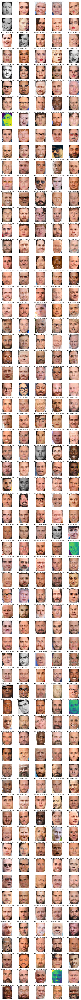

In [107]:
preds = model.predict('data/test_aligned/', show_img = True)